# Capstone Project — Detecção de Doenças em Plantas (Detecção de Objetos)

**Processamento Digital de Imagens · Ciência da Computação — 8º Período**
Centro Universitário Dom Helder · Prof. Dr. Fischer Stefan
Dataset: **Plant Disease Detection** (Roboflow · formato YOLOv8 · *bounding boxes* por lesão)

---

| Bloco | Técnica |
|---|---|
| 1 | **Threshold & Blur** — suavização e limiarização |
| 2 | **Edge & Corner Detection** — Canny, Sobel, Harris, Shi-Tomasi |
| 3 | **Object Detection + ROI + Blend/Paste** — segmentação HSV + composição visual |
| 4 | **YOLOv8 (detecção)** — treinado para localizar lesões + comparação com HSV |

> Diferente de um dataset de classificação (uma pasta por classe), este dataset traz **caixas
> delimitadoras reais por lesão** (`labels/*.txt` no formato YOLO). Isso permite **treinar
> detecção de objetos** e medir a qualidade contra o *ground-truth* (IoU / recall / precisão).

> Execute **Run All**. Todos os resultados são salvos em `results/`.

In [1]:
# ── Cole sua Private API Key do Roboflow aqui (roboflow.com -> Settings -> API) ──
ROBOFLOW_API_KEY = "COLE_SUA_API_KE_AQUI"
# ─────────────────────────────────────────────────────────────────────────────

In [2]:
%matplotlib inline
import sys, os, glob, random, warnings
from pathlib import Path
warnings.filterwarnings('ignore')

def _achar_root():
    root = Path.cwd()
    while root != root.parent:
        if (root / '.git').exists() or (root / 'requirements.txt').exists():
            break
        root = root.parent
    return root

ROOT = _achar_root()
sys.path.insert(0, str(ROOT / 'src'))

import cv2
import numpy as np
import matplotlib.pyplot as plt

from preprocessing import (
    converter_grayscale, aplicar_blur_gaussiano, aplicar_blur_mediano,
    aplicar_blur_bilateral, aplicar_threshold_simples,
    aplicar_threshold_otsu, aplicar_threshold_adaptativo_gaussiano,
)
from detection import (
    detectar_bordas_canny, detectar_bordas_sobel,
    detectar_cantos_harris, detectar_cantos_shi_tomasi,
    detectar_contornos_externos,
    segmentar_folha_verde, detectar_lesoes_hsv,
    destacar_regiao_doenca, compor_diagnostico_visual,
    aplicar_blur_em_roi,
)
from yolo_detection import (
    carregar_modelo_deteccao, carregar_modelo_custom,
    detectar_objetos, treinar_detector, avaliar_modelo,
    casar_caixas, iou_xyxy, comparar_metodos,
)
from dataset import (
    verificar_dataset, listar_classes, nome_legivel,
    listar_imagens, caminho_label, ler_labels_yolo,
    carregar_imagem_rgb, amostrar_imagens, amostrar_por_classe,
    desenhar_boxes, estatisticas_dataset, preparar_yaml_treino,
    score_imagem,
)
from utils import grade, sep

plt.rcParams.update({'figure.dpi': 100, 'figure.facecolor': 'white'})

TAMANHO  = (416, 416)
DATA_DIR = str(ROOT / 'data')

# Pastas de resultados por secao do notebook
RD = {
    'dataset':   str(ROOT / 'results' / '01_dataset'),
    'blur':      str(ROOT / 'results' / '02_blur_threshold'),
    'edges':     str(ROOT / 'results' / '03_edges_corners'),
    'detection': str(ROOT / 'results' / '04_detection_blend'),
    'yolo':      str(ROOT / 'results' / '05_yolo'),
    'comp':      str(ROOT / 'results' / '06_comparacao'),
}
for _d in RD.values():
    os.makedirs(_d, exist_ok=True)

import torch
gpu_ok   = torch.cuda.is_available()
gpu_nome = torch.cuda.get_device_name(0) if gpu_ok else 'N/A'
print('Setup completo.')
print(f'ROOT        : {ROOT}')
print(f'DATA_DIR    : {DATA_DIR}')
print(f'GPU (CUDA)  : {"sim — " + gpu_nome if gpu_ok else "nao disponivel — YOLO usara CPU"}')


Setup completo.
ROOT        : c:\Users\felip\OneDrive\Documentos\Estudos\PID_Project
DATA_DIR    : c:\Users\felip\OneDrive\Documentos\Estudos\PID_Project\data
GPU (CUDA)  : sim — NVIDIA GeForce RTX 4050 Laptop GPU


---
## 1 · Dataset Plant Disease Detection (Roboflow)

In [3]:
if verificar_dataset(DATA_DIR):
    print('Dataset ja disponivel em:', DATA_DIR)
    print(os.listdir(DATA_DIR))
else:
    from roboflow import Roboflow
    rf = Roboflow(api_key=ROBOFLOW_API_KEY)
    project = rf.workspace("detection-idqhz").project("plant-disease-detection-4pmen")
    version = project.version(6)
    dataset = version.download(model_format="yolov8", location=DATA_DIR, overwrite=True)
    print(dataset.location)
    print(os.listdir(DATA_DIR))

assert verificar_dataset(DATA_DIR), 'Dataset nao encontrado em ' + str(DATA_DIR)


Dataset ja disponivel em: c:\Users\felip\OneDrive\Documentos\Estudos\PID_Project\data
['data.yaml', 'data_treino.yaml', 'README.dataset.txt', 'README.roboflow.txt', 'test', 'train', 'valid']


In [4]:
stats   = estatisticas_dataset(DATA_DIR)
CLASSES = listar_classes(DATA_DIR)
total   = stats['train'] + stats['valid'] + stats['test']

print(f"Classes : {stats['n_classes']}")
print(f"Train   : {stats['train']:,} imagens")
print(f"Valid   : {stats['valid']:,} imagens")
print(f"Test    : {stats['test']:,} imagens")
print(f"Total   : {total:,} imagens")
if total:
    print(f"Split   : {stats['train']/total*100:.0f}% train / "
          f"{stats['valid']/total*100:.0f}% val / {stats['test']/total*100:.0f}% test")
print()
print('Classes (lidas do data.yaml):')
for i, c in enumerate(CLASSES):
    print(f"  {i:>2}. {nome_legivel(c)}")

print()
grupos = {}
for c in CLASSES:
    planta = nome_legivel(c).split()[0]
    grupos.setdefault(planta, {'doencas': [], 'saudaveis': []})
    if 'healthy' in c.lower():
        grupos[planta]['saudaveis'].append(nome_legivel(c))
    else:
        grupos[planta]['doencas'].append(nome_legivel(c))

print('Distribuicao por planta:')
for planta, cats in sorted(grupos.items()):
    nd = len(cats['doencas'])
    doencas_str = ', '.join(cats['doencas']) if cats['doencas'] else '-'
    print(f"  {planta:<8}: {nd} doenca(s)  [{doencas_str}]")

n_doentes = sum(len(v['doencas']) for v in grupos.values())
n_saud    = sum(len(v['saudaveis']) for v in grupos.values())
print()
print(f'  Classes de doenca   : {n_doentes} ({n_doentes/len(CLASSES)*100:.0f}%)')
print(f'  Classes saudaveis   : {n_saud} ({n_saud/len(CLASSES)*100:.0f}%)')


Classes : 8
Train   : 2,790 imagens
Valid   : 814 imagens
Test    : 396 imagens
Total   : 4,000 imagens
Split   : 70% train / 20% val / 10% test

Classes (lidas do data.yaml):
   0. Apple Cedar Rust
   1. Apple Healthy
   2. Cherry Healthy
   3. Cherry Powdery Mildew
   4. Grape Black Rot
   5. Grape Healthy
   6. Tomato Healthy
   7. Tomato Septoria Leaf Spot

Distribuicao por planta:
  Apple   : 1 doenca(s)  [Apple Cedar Rust]
  Cherry  : 1 doenca(s)  [Cherry Powdery Mildew]
  Grape   : 1 doenca(s)  [Grape Black Rot]
  Tomato  : 1 doenca(s)  [Tomato Septoria Leaf Spot]

  Classes de doenca   : 4 (50%)
  Classes saudaveis   : 4 (50%)


  Salvo -> c:\Users\felip\OneDrive\Documentos\Estudos\PID_Project\results\01_dataset\00_amostras_dataset.png


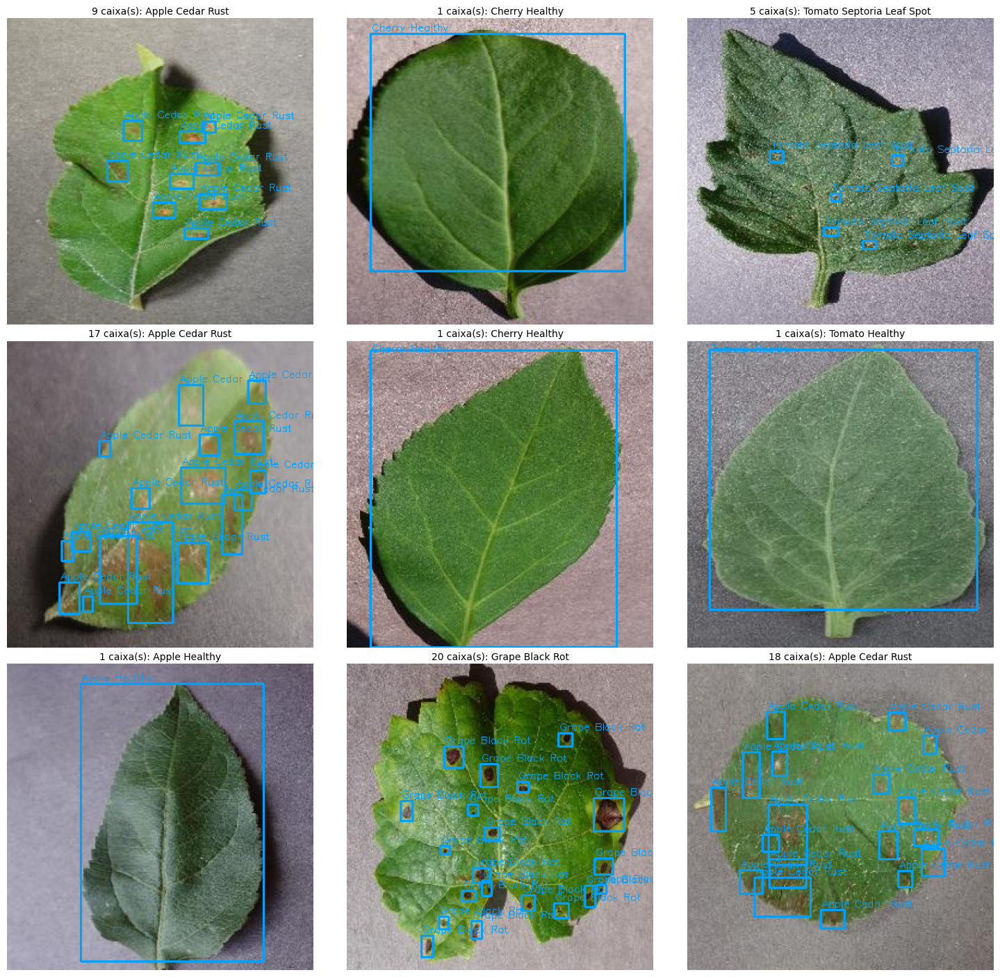

Caixas em laranja = ground-truth (anotacao manual do dataset).


In [5]:
# 9 amostras com caixas ground-truth (3 cols x 3 rows)
amostras_path = amostrar_imagens(DATA_DIR, n=9, split='train', com_label=True, semente=1)

imgs_grid, tits_grid = [], []
for p in amostras_path:
    im  = cv2.resize(carregar_imagem_rgb(p), TAMANHO)
    gt  = ler_labels_yolo(p, im.shape)
    imgs_grid.append(desenhar_boxes(im, gt, CLASSES))
    nomes_im = sorted({nome_legivel(CLASSES[c[0]]) for c in gt}) if gt else ['sem rotulo']
    tits_grid.append(f"{len(gt)} caixa(s): {', '.join(nomes_im)[:28]}")

grade(imgs_grid, tits_grid, cols=3, figsize=(15, 14),
      nome='00_amostras_dataset.png', results_dir=RD['dataset'])
print('Caixas em laranja = ground-truth (anotacao manual do dataset).')


In [ ]:
# Seleciona quatro amostras de trabalho para os blocos de demo
sel   = amostrar_imagens(DATA_DIR, n=12, split='train', com_label=True, semente=7)
PATH_A, PATH_B = sel[0], sel[1]
IMG_A  = cv2.resize(carregar_imagem_rgb(PATH_A), TAMANHO)
IMG_B  = cv2.resize(carregar_imagem_rgb(PATH_B), TAMANHO)
GT_A   = ler_labels_yolo(PATH_A, IMG_A.shape)
GT_B   = ler_labels_yolo(PATH_B, IMG_B.shape)

if len(GT_B) > len(GT_A):
    IMG_A, IMG_B = IMG_B, IMG_A
    GT_A,  GT_B  = GT_B,  GT_A
    PATH_A, PATH_B = PATH_B, PATH_A

IMG_C = cv2.resize(carregar_imagem_rgb(sel[2]), TAMANHO)
IMG_D = cv2.resize(carregar_imagem_rgb(sel[3]), TAMANHO)
GT_C  = ler_labels_yolo(sel[2], IMG_C.shape)
GT_D  = ler_labels_yolo(sel[3], IMG_D.shape)

NOME_A = ', '.join(sorted({nome_legivel(CLASSES[c[0]]) for c in GT_A})) or 'sem rotulo'
NOME_B = ', '.join(sorted({nome_legivel(CLASSES[c[0]]) for c in GT_B})) or 'sem rotulo'
NOME_C = ', '.join(sorted({nome_legivel(CLASSES[c[0]]) for c in GT_C})) or 'sem rotulo'
NOME_D = ', '.join(sorted({nome_legivel(CLASSES[c[0]]) for c in GT_D})) or 'sem rotulo'

print('Amostras de trabalho:')
for l, p, gt, nome in [('A', PATH_A, GT_A, NOME_A), ('B', PATH_B, GT_B, NOME_B),
                        ('C', sel[2], GT_C, NOME_C),  ('D', sel[3], GT_D, NOME_D)]:
    print(f'  {l}: {os.path.basename(p)}  ({len(gt)} caixas -> {nome})')

grade(
    [desenhar_boxes(IMG_A, GT_A, CLASSES), desenhar_boxes(IMG_B, GT_B, CLASSES),
     desenhar_boxes(IMG_C, GT_C, CLASSES), desenhar_boxes(IMG_D, GT_D, CLASSES)],
    [f'A — {NOME_A}'[:30], f'B — {NOME_B}'[:30],
     f'C — {NOME_C}'[:30], f'D — {NOME_D}'[:30]],
    cols=4, figsize=(16, 4),
    nome='00b_amostras_principais.png', results_dir=RD['dataset'],
)

# Blur Gaussiano 5×5 — pré-processamento base aplicado antes de todos os blocos seguintes
# A análise do Bloco 1 confirmará que o blur reduz ruído; por isso já o aplicamos aqui.
IMG_A_B = aplicar_blur_gaussiano(IMG_A, kernel=(5, 5))
IMG_B_B = aplicar_blur_gaussiano(IMG_B, kernel=(5, 5))
IMG_C_B = aplicar_blur_gaussiano(IMG_C, kernel=(5, 5))
IMG_D_B = aplicar_blur_gaussiano(IMG_D, kernel=(5, 5))
print()
print('Pré-processamento Gaussian Blur 5×5 criado para todas as amostras:')
print('  IMG_A_B, IMG_B_B, IMG_C_B, IMG_D_B — usadas nos Blocos 2, 3 e 4.')

In [ ]:
# Seleciona imagens especializadas por criterio mensuravel para cada bloco de demo
random.seed(0)
_pool = listar_imagens(DATA_DIR, 'train')
random.shuffle(_pool)
_pool = [p for p in _pool[:80]
         if os.path.exists(caminho_label(p)) and os.path.getsize(caminho_label(p)) > 0]

_r = max(_pool, key=lambda p: score_imagem(p, 'ruido',     TAMANHO))
_c = max(_pool, key=lambda p: score_imagem(p, 'contraste', TAMANHO))
_e = max(_pool, key=lambda p: score_imagem(p, 'bordas',    TAMANHO))

IMG_NOISY    = cv2.resize(carregar_imagem_rgb(_r), TAMANHO)
IMG_CONTRAST = cv2.resize(carregar_imagem_rgb(_c), TAMANHO)
IMG_EDGE     = cv2.resize(carregar_imagem_rgb(_e), TAMANHO)

print('Imagens selecionadas automaticamente por criterio:')
print(f'  Blur      (max Laplacian var)  : {os.path.basename(_r)}')
print(f'  Threshold (max bimodalidade)   : {os.path.basename(_c)}')
print(f'  Canny     (max pixels de borda): {os.path.basename(_e)}')

# Versões pré-processadas com Gaussian Blur 5×5
IMG_NOISY_B    = aplicar_blur_gaussiano(IMG_NOISY,    kernel=(5, 5))
IMG_CONTRAST_B = aplicar_blur_gaussiano(IMG_CONTRAST, kernel=(5, 5))
IMG_EDGE_B     = aplicar_blur_gaussiano(IMG_EDGE,     kernel=(5, 5))

---
## 2 · Bloco 1 — Threshold & Blur

Suavização para reduzir ruído e limiarização para segmentar regiões.
Comparamos blur (Gaussian, Median, Bilateral) e limiarização (Simples, Otsu, Adaptativo).

  Salvo -> c:\Users\felip\OneDrive\Documentos\Estudos\PID_Project\results\02_blur_threshold\01_blur_comparacao.png


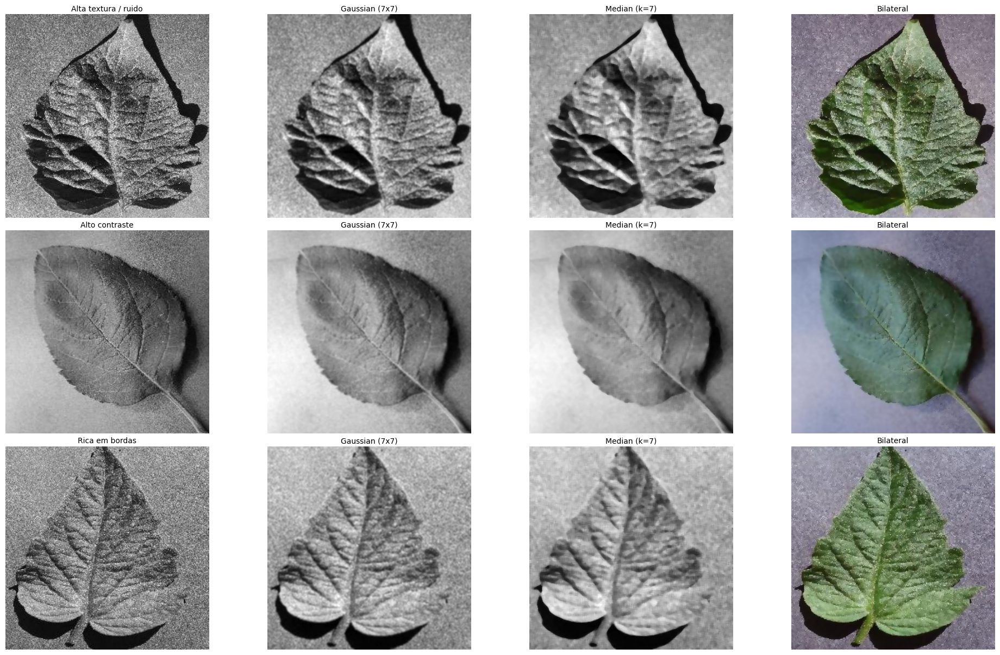

In [8]:
gray = converter_grayscale(IMG_A)

# Grade: 3 imagens x (Original | Gaussian | Median | Bilateral) = 12 imagens, 4 colunas
_amostras_blur = [
    (IMG_NOISY,    'Alta textura / ruido'),
    (IMG_CONTRAST, 'Alto contraste'),
    (IMG_EDGE,     'Rica em bordas'),
]
imgs_blur, tits_blur = [], []
for img, rot in _amostras_blur:
    gray_i = converter_grayscale(img)
    imgs_blur += [gray_i,
                  aplicar_blur_gaussiano(gray_i, kernel=(7, 7)),
                  aplicar_blur_mediano(gray_i, ksize=7),
                  aplicar_blur_bilateral(img)]
    tits_blur += [f'{rot}', 'Gaussian (7x7)', 'Median (k=7)', 'Bilateral']

grade(imgs_blur, tits_blur, cols=4, figsize=(20, 12),
      nome='01_blur_comparacao.png', results_dir=RD['blur'])

# Variaveis preservadas para a analise numerica
gray_n     = converter_grayscale(IMG_NOISY)
b_gauss_n  = aplicar_blur_gaussiano(gray_n, kernel=(7, 7))
b_median_n = aplicar_blur_mediano(gray_n, ksize=7)
b_bilat_n  = aplicar_blur_bilateral(IMG_NOISY)


In [9]:
sep('Analise: Blur como redutor de ruido')

std_orig  = float(gray_n.std())
std_gauss = float(b_gauss_n.std())
std_med   = float(b_median_n.std())

print('Como foi calculado:')
print('  std = desvio padrao dos valores de pixel.')
print('  Ruido = pixels vizinhos com valores muito diferentes -> std alto.')
print('  Blur faz medias de vizinhancas -> pixels ficam parecidos -> std cai.')
print()
print(f'  Desvio padrao Original  : {std_orig:.2f}')
print(f'  Desvio padrao Gaussiano : {std_gauss:.2f}  -> reducao de {(1 - std_gauss/std_orig)*100:.1f}%')
print(f'  Desvio padrao Mediano   : {std_med:.2f}  -> reducao de {(1 - std_med/std_orig)*100:.1f}%')
print()
print('Observacao: o Plant Disease Detection (Roboflow) contem fotos de campo,')
print('com iluminacao natural variavel, sombras de nervuras e reflexos da cera')
print('foliar. Isso eleva o ruido em relacao a datasets de laboratorio controlado.')
print()
print(f'  Reducao de std (Gaussiano): {(1 - std_gauss/std_orig)*100:.1f}%  — esperado 15-35% para folhas de campo')
print(f'  Reducao de std (Mediano)  : {(1 - std_med/std_orig)*100:.1f}%')
print()
print('Qual blur para cada tipo de doenca deste dataset?')
print('  Tomato septoria (manchas pequenas/difusas) -> Mediano preserva bordas pontuais')
print('  Grape black rot (lesao escura bem definida) -> Gaussiano suficiente antes do Canny')
print('  Cherry powdery mildew (textura granular)   -> Bilateral preserva o contorno da mancha')
print('  Apple cedar rust (padrao difuso/alaranjado) -> Gaussiano + Otsu segmenta bem')
print()
print('Conclusao: o Bilateral e mais lento mas preserva as bordas das lesoes,')
print('sendo o mais adequado como pre-filtro para a deteccao por cor (HSV) no Bloco 3.')


  Analise: Blur como redutor de ruido
Como foi calculado:
  std = desvio padrao dos valores de pixel.
  Ruido = pixels vizinhos com valores muito diferentes -> std alto.
  Blur faz medias de vizinhancas -> pixels ficam parecidos -> std cai.

  Desvio padrao Original  : 49.95
  Desvio padrao Gaussiano : 42.03  -> reducao de 15.8%
  Desvio padrao Mediano   : 42.44  -> reducao de 15.0%

Observacao: o Plant Disease Detection (Roboflow) contem fotos de campo,
com iluminacao natural variavel, sombras de nervuras e reflexos da cera
foliar. Isso eleva o ruido em relacao a datasets de laboratorio controlado.

  Reducao de std (Gaussiano): 15.8%  — esperado 15-35% para folhas de campo
  Reducao de std (Mediano)  : 15.0%

Qual blur para cada tipo de doenca deste dataset?
  Tomato septoria (manchas pequenas/difusas) -> Mediano preserva bordas pontuais
  Grape black rot (lesao escura bem definida) -> Gaussiano suficiente antes do Canny
  Cherry powdery mildew (textura granular)   -> Bilateral pres

  Salvo -> c:\Users\felip\OneDrive\Documentos\Estudos\PID_Project\results\02_blur_threshold\02_threshold_comparacao.png


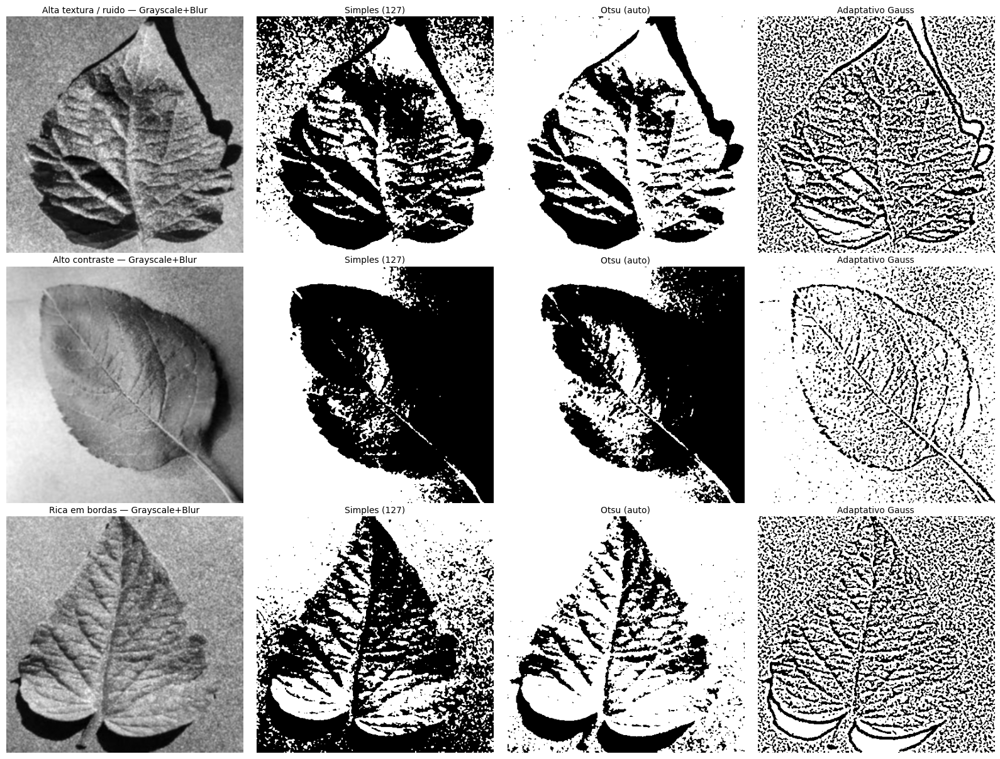

In [10]:
gray_blur = aplicar_blur_gaussiano(gray, kernel=(5, 5))

# Grade: 3 imagens x (Grayscale+Blur | Simples | Otsu | Adaptativo) = 12 imagens, 4 colunas
_amostras_thr = [
    (IMG_NOISY,    'Alta textura / ruido'),
    (IMG_CONTRAST, 'Alto contraste'),
    (IMG_EDGE,     'Rica em bordas'),
]
imgs_thr, tits_thr = [], []
for img, rot in _amostras_thr:
    gc = aplicar_blur_gaussiano(converter_grayscale(img), kernel=(5, 5))
    imgs_thr += [gc,
                 aplicar_threshold_simples(gc, valor=127),
                 aplicar_threshold_otsu(gc),
                 aplicar_threshold_adaptativo_gaussiano(gc, block_size=15, C=4)]
    tits_thr += [f'{rot} — Grayscale+Blur', 'Simples (127)', 'Otsu (auto)', 'Adaptativo Gauss']

grade(imgs_thr, tits_thr, cols=4, figsize=(16, 12),
      nome='02_threshold_comparacao.png', results_dir=RD['blur'])

# Variaveis preservadas da imagem de alto contraste para a analise numerica
gray_blur_c = aplicar_blur_gaussiano(converter_grayscale(IMG_CONTRAST), kernel=(5, 5))
t_simples_c = aplicar_threshold_simples(gray_blur_c, valor=127)
t_otsu_c    = aplicar_threshold_otsu(gray_blur_c)
t_adapt_c   = aplicar_threshold_adaptativo_gaussiano(gray_blur_c, block_size=15, C=4)


In [11]:
sep('Analise: Limiarizacao (Threshold)')

retval, _ = cv2.threshold(gray_blur_c, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
limiar_otsu = int(retval)
total_px = gray_blur_c.shape[0] * gray_blur_c.shape[1]
px_s = int(t_simples_c.sum()) // 255
px_o = int(t_otsu_c.sum()) // 255
px_a = int(t_adapt_c.sum()) // 255

print(f'Limiar Otsu calculado automaticamente: {limiar_otsu}')
print(f'  pixels > {limiar_otsu} -> branco  |  pixels <= {limiar_otsu} -> preto')
print()
print(f'Pixels brancos de {total_px:,} total:')
print(f'  Simples (127 fixo) : {px_s:>7,}  ({px_s/total_px*100:.1f}%)')
print(f'  Otsu               : {px_o:>7,}  ({px_o/total_px*100:.1f}%)')
print(f'  Adaptativo         : {px_a:>7,}  ({px_a/total_px*100:.1f}%)')
print()
print('Como cada metodo decide o limiar:')
print('  Simples   : valor manual (127). Falha se a imagem for mais clara/escura.')
print('  Otsu      : analisa o histograma e escolhe o T que minimiza a variancia')
print('              intraclasse. Automatico e especifico para esta imagem.')
print('  Adaptativo: limiar por bloco (15x15) -> captura variacao local de luz e')
print('              textura fina das manchas. Tende a marcar mais pixels.')


  Analise: Limiarizacao (Threshold)
Limiar Otsu calculado automaticamente: 117
  pixels > 117 -> branco  |  pixels <= 117 -> preto

Pixels brancos de 173,056 total:
  Simples (127 fixo) :  65,795  (38.0%)
  Otsu               :  81,676  (47.2%)
  Adaptativo         : 144,415  (83.4%)

Como cada metodo decide o limiar:
  Simples   : valor manual (127). Falha se a imagem for mais clara/escura.
  Otsu      : analisa o histograma e escolhe o T que minimiza a variancia
              intraclasse. Automatico e especifico para esta imagem.
  Adaptativo: limiar por bloco (15x15) -> captura variacao local de luz e
              textura fina das manchas. Tende a marcar mais pixels.


  Salvo -> c:\Users\felip\OneDrive\Documentos\Estudos\PID_Project\results\02_blur_threshold\03_threshold_amostras.png


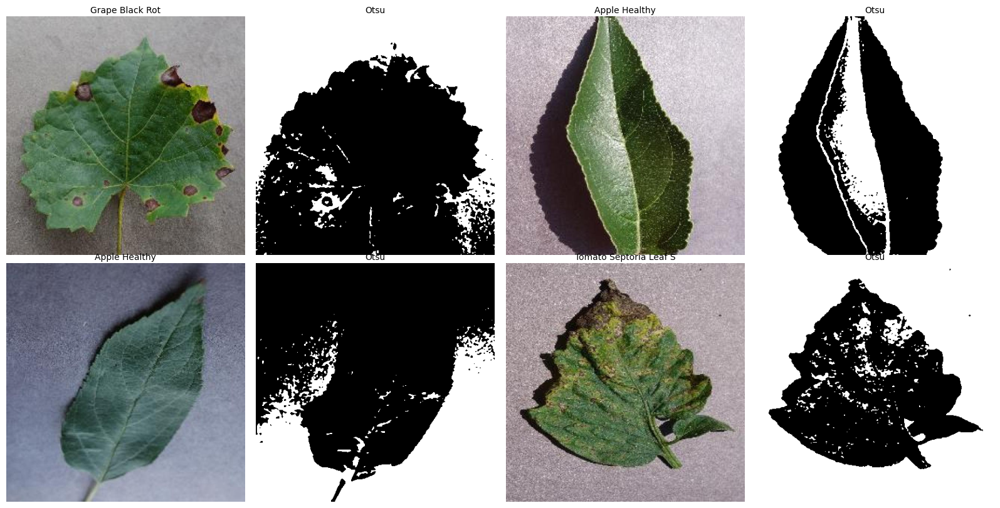


  Analise: Otsu entre as amostras A-B-C-D
  Amostra A (Grape Black Rot     ):  65,928 px brancos (38.1%)
  Amostra B (Apple Healthy       ): 107,300 px brancos (62.0%)
  Amostra C (Apple Healthy       ):  59,200 px brancos (34.2%)
  Amostra D (Tomato Septoria Leaf): 109,514 px brancos (63.3%)

Analise por tipo de doenca:
  Grape black rot       -> lesao ESCURA: pixels PRETOS no Otsu
  Apple cedar rust      -> lesao LARANJA: intensidade media; Otsu pode mesclar com folha
  Cherry powdery mildew -> po BRANCO: pixels BRANCOS no Otsu (facil)
  Tomato septoria       -> manchas MISTAS: Adaptativo captura melhor

Conclusao do Bloco 1: Threshold NAO localiza nem identifica a doenca especifica.


In [12]:
# 4 amostras x (Original | Otsu) = 8 imagens, 4 colunas, 2 linhas
_amostras_abcd = [
    (IMG_A, GT_A, NOME_A), (IMG_B, GT_B, NOME_B),
    (IMG_C, GT_C, NOME_C), (IMG_D, GT_D, NOME_D),
]
imgs_abcd, tits_abcd = [], []
for img, gt, nome_cls in _amostras_abcd:
    otsu_i = aplicar_threshold_otsu(aplicar_blur_gaussiano(converter_grayscale(img)))
    imgs_abcd += [img, otsu_i]
    tits_abcd += [nome_cls[:22], 'Otsu']

grade(imgs_abcd, tits_abcd, cols=4, figsize=(16, 8),
      nome='03_threshold_amostras.png', results_dir=RD['blur'])

otsu_a = aplicar_threshold_otsu(aplicar_blur_gaussiano(converter_grayscale(IMG_A)))
otsu_b = aplicar_threshold_otsu(aplicar_blur_gaussiano(converter_grayscale(IMG_B)))

sep('Analise: Otsu entre as amostras A-B-C-D')
total_px = TAMANHO[0] * TAMANHO[1]
for letra, img, gt, nome_cls in zip('ABCD',
                                    [IMG_A, IMG_B, IMG_C, IMG_D],
                                    [GT_A,  GT_B,  GT_C,  GT_D],
                                    [NOME_A, NOME_B, NOME_C, NOME_D]):
    ot  = aplicar_threshold_otsu(aplicar_blur_gaussiano(converter_grayscale(img)))
    px  = int(ot.sum()) // 255
    pct = px / total_px * 100
    print(f'  Amostra {letra} ({nome_cls[:20]:<20}): {px:>7,} px brancos ({pct:.1f}%)')
print()
print('Analise por tipo de doenca:')
print('  Grape black rot       -> lesao ESCURA: pixels PRETOS no Otsu')
print('  Apple cedar rust      -> lesao LARANJA: intensidade media; Otsu pode mesclar com folha')
print('  Cherry powdery mildew -> po BRANCO: pixels BRANCOS no Otsu (facil)')
print('  Tomato septoria       -> manchas MISTAS: Adaptativo captura melhor')
print()
print('Conclusao do Bloco 1: Threshold NAO localiza nem identifica a doenca especifica.')


---
## 3 · Bloco 2 — Edge & Corner Detection

Bordas (Canny, Sobel) e cantos (Harris, Shi-Tomasi) para identificar estruturas:
bordas das lesões, nervuras e contornos da folha.

In [ ]:
canny_a    = detectar_bordas_canny(IMG_A_B)
canny_b    = detectar_bordas_canny(IMG_B_B)
canny_c    = detectar_bordas_canny(IMG_C_B)
canny_edge = detectar_bordas_canny(IMG_EDGE_B)

# Grade: 4 amostras x (Blur | Canny) = 8 imagens, 4 colunas, 2 linhas
grade(
    [IMG_A_B,    canny_a,    IMG_EDGE_B, canny_edge,
     IMG_B_B,    canny_b,    IMG_C_B,    canny_c],
    [f'A — Blur+{NOME_A}'[:26],       'Canny — A',
     'Edge-rich (Blur)',               'Canny — edge-rich',
     f'B — Blur+{NOME_B}'[:26],       'Canny — B',
     f'C — Blur+{NOME_C}'[:26],       'Canny — C'],
    cols=4, figsize=(16, 8),
    nome='04_canny.png', results_dir=RD['edges'],
)

In [ ]:
sep('Analise: Canny')

bordas_edge = int((canny_edge > 0).sum())
bordas_b    = int((canny_b > 0).sum())
npx = TAMANHO[0] * TAMANHO[1]

# Mediana calculada sobre a imagem já pré-blurrada
med_edge = int(np.median(converter_grayscale(IMG_EDGE_B)))
med_b    = int(np.median(converter_grayscale(IMG_B_B)))

print('Pipeline aplicado: Blur Gaussiano 5×5 → Canny (blur interno + Sobel + histerese).')
print()
print('Como o Canny funciona (4 etapas):')
print('  1. Gaussian blur       -> remove ruido para evitar falsas bordas')
print('  2. Gradiente Sobel     -> calcula a variacao de intensidade (dx, dy)')
print('  3. Non-max suppression -> afina as bordas para 1 pixel')
print('  4. Histerese (T1, T2)  -> T1 fixa bordas fortes; T2 conecta as fracas')
print()
print('Thresholds automaticos pela mediana (T1=0.7*med, T2=1.3*med):')
print(f'  Edge-rich (blur): mediana={med_edge}  T1={int(0.7*med_edge)}  T2={int(1.3*med_edge)}')
print(f'  Amostra B (blur): mediana={med_b}  T1={int(0.7*med_b)}  T2={int(1.3*med_b)}')
print()
print('Pixels de borda detectados:')
print(f'  Edge-rich : {bordas_edge:>6,}  ({bordas_edge/npx*100:.1f}% da imagem)')
print(f'  Amostra B : {bordas_b:>6,}  ({bordas_b/npx*100:.1f}% da imagem)')
print()
print('Interpretacao para este dataset:')
print('  Grape black rot e Tomato septoria -> bordas nitidas entre lesao e tecido saudavel')
print('                                       -> Canny detecta bem o contorno da lesao')
print('  Cherry powdery mildew             -> po difuso sem borda definida')
print('                                       -> menos pixels de borda, Canny menos eficaz')
print('  Apple cedar rust                  -> transicao de cor gradual (laranja -> verde)')
print('                                       -> Canny captura nervuras mais que a lesao em si')

In [ ]:
# Grade: 3 imagens x (Blur | Sobel X | Sobel Y | Magnitude) = 12 imagens, 4 colunas
_amostras_sobel = [
    (IMG_A_B,    f'A — {NOME_A}'[:22]),
    (IMG_EDGE_B, 'Edge-rich (blur)'),
    (IMG_B_B,    f'B — {NOME_B}'[:22]),
]
imgs_sobel, tits_sobel = [], []
for img, rot in _amostras_sobel:
    mag_i, sx_i, sy_i = detectar_bordas_sobel(img)
    imgs_sobel += [img, sx_i, sy_i, mag_i]
    tits_sobel += [f'{rot} — Blur', 'Sobel X (vert.)', 'Sobel Y (horiz.)', 'Magnitude']

grade(imgs_sobel, tits_sobel, cols=4, figsize=(16, 12),
      nome='05_sobel.png', results_dir=RD['edges'])

# Variaveis preservadas para analise numerica
mag, sx, sy = detectar_bordas_sobel(IMG_EDGE_B)

In [ ]:
sep('Analise: Sobel')

mag_b, _, _ = detectar_bordas_sobel(IMG_B_B)

print('Pipeline aplicado: Blur Gaussiano 5×5 → Sobel X/Y → Magnitude.')
print()
print('Como o Sobel funciona:')
print('  Dois kernels 3x3 de convolucao:')
print('    Sobel X = [[-1 0 +1],[-2 0 +2],[-1 0 +1]]  -> bordas verticais')
print('    Sobel Y = transposta de Sobel X            -> bordas horizontais')
print('  Magnitude = sqrt(Gx^2 + Gy^2) -> forca do gradiente')
print('  Angulo    = atan2(Gy, Gx)     -> direcao da borda')
print()
print('Magnitude media do gradiente:')
print(f'  Edge-rich (blur): {mag.mean():.2f}')
print(f'  Amostra B (blur): {mag_b.mean():.2f}  ({(mag_b.mean()/mag.mean()-1)*100:+.1f}% vs edge-rich)')
print()
print('Histograma de intensidade do gradiente (Edge-rich):')
hist, bins = np.histogram(mag.ravel(), bins=5, range=(0, 255))
for i in range(len(hist)):
    barra = 'x' * (hist[i] // max(1, hist.max() // 30))
    print(f'  [{int(bins[i]):>3}-{int(bins[i+1]):>3}]  {hist[i]:>7,}  {barra}')
print()
print('A maioria dos pixels tem gradiente baixo (regioes uniformes: fundo,')
print('tecido liso). Picos intermediarios = nervuras e bordas de lesoes.')
print(f'Edge-rich escolhida por ter a maior soma de Canny ({int((canny_edge>0).sum()):,} px),')
print('o que confirma a densidade de bordas visivel no Sobel.')

In [ ]:
# Grade: 3 amostras x (Blur | Harris | Shi-Tomasi) = 9 imagens, 3 colunas
_amostras_cantos = [
    (IMG_A_B, f'A — {NOME_A}'[:22]),
    (IMG_B_B, f'B — {NOME_B}'[:22]),
    (IMG_C_B, f'C — {NOME_C}'[:22]),
]
imgs_cantos, tits_cantos = [], []
for img, rot in _amostras_cantos:
    h_img, n_h_i = detectar_cantos_harris(img)
    s_img, n_s_i = detectar_cantos_shi_tomasi(img, max_cantos=120)
    imgs_cantos += [img, h_img, s_img]
    tits_cantos += [f'{rot} (blur)', f'Harris ({n_h_i})', f'Shi-Tomasi ({n_s_i})']

grade(imgs_cantos, tits_cantos, cols=3, figsize=(14, 14),
      nome='06_cantos.png', results_dir=RD['edges'])

img_harris,    n_h = detectar_cantos_harris(IMG_A_B)
img_shitomasi, n_s = detectar_cantos_shi_tomasi(IMG_A_B, max_cantos=120)

In [ ]:
sep('Analise: Harris e Shi-Tomasi')

_, n_h_b = detectar_cantos_harris(IMG_B_B)
_, n_s_b = detectar_cantos_shi_tomasi(IMG_B_B, max_cantos=120)

print('Pipeline aplicado: Blur Gaussiano 5×5 → Harris / Shi-Tomasi.')
print()
print('Harris:')
print('  Para cada pixel monta a matriz M de auto-correlacao 2x2.')
print('  R = det(M) - k * trace(M)^2   (k = 0.04)')
print('  R >> 0 -> canto | R << 0 -> borda | R ~ 0 -> regiao plana')
print()
print('Shi-Tomasi:')
print('  Usa min(autovalor1, autovalor2) em vez de det/trace.')
print('  E mais estavel e e o padrao do goodFeaturesToTrack do OpenCV.')
print()
print(f'Cantos Harris:     A = {n_h:>5,}   |   B = {n_h_b:>5,}')
print(f'Cantos Shi-Tomasi: A = {n_s:>5}   |   B = {n_s_b:>5}  (limite=120)')
print()
print('Cantos concentram-se em junçoes de nervuras e nos contornos irregulares')
print('das manchas — pontos uteis como features para rastreamento/registro.')

In [ ]:
cont_a, n_ca = detectar_contornos_externos(IMG_A_B)
cont_b, n_cb = detectar_contornos_externos(IMG_B_B)
cont_c, n_cc = detectar_contornos_externos(IMG_C_B)
cont_d, n_cd = detectar_contornos_externos(IMG_D_B)

grade(
    [cont_a, cont_b, cont_c, cont_d],
    [f'A — {n_ca} cont.', f'B — {n_cb} cont.',
     f'C — {n_cc} cont.', f'D — {n_cd} cont.'],
    cols=4, figsize=(16, 4),
    nome='07_contornos.png', results_dir=RD['edges'],
)

sep('Resumo do Bloco 2')
mag_b, _, _ = detectar_bordas_sobel(IMG_B_B)
print(f'  {"Metrica":<22}  {"A":>10}  {"B":>10}  {"C":>10}  {"D":>10}')
print(f'  {"-"*64}')
print(f'  {"Canny (bordas)":<22}  {int((canny_a>0).sum()):>10,}  {int((canny_b>0).sum()):>10,}  {int((canny_c>0).sum()):>10,}  {int((canny_edge>0).sum()):>10,}')
print(f'  {"Contornos":<22}  {n_ca:>10}  {n_cb:>10}  {n_cc:>10}  {n_cd:>10}')
print()
print('Todas as tecnicas acima receberam imagens pre-processadas com Blur 5x5.')
print('Estes detectores medem ESTRUTURA, mas nao sabem onde esta a doenca.')
print('Para isso usamos cor (HSV, Bloco 3) e aprendizado (YOLO, Bloco 4).')

---
## 4 · Bloco 3 — Detecção de Objeto + ROI + Blend/Paste

Segmentação por cor (HSV) para isolar a folha e as manchas de doença.
Composição visual (máscara, blend colorido, ROI) e comparação das caixas HSV
contra o **ground-truth** do dataset.

In [ ]:
# HSV VERDE — isola a folha do fundo (Blur 5×5 como pré-processamento)
folha_seg, mascara_folha = segmentar_folha_verde(IMG_A_B)

grade(
    [IMG_A, IMG_A_B, mascara_folha, folha_seg],
    ['Original', 'Pré-Blur Gaussiano (5×5)', 'Máscara HSV verde (folha)', 'Folha segmentada'],
    cols=4, figsize=(18, 5),
    nome='08_segmentacao_folha.png', results_dir=RD['detection'],
)

sep('Analise: Segmentacao HSV — folha (canal verde)')
total_px   = int(IMG_A_B.shape[0] * IMG_A_B.shape[1])
area_folha = int(mascara_folha.sum()) // 255
print('Pipeline: Blur 5x5 → RGB→HSV → cv2.inRange(verde H=25..90) → CLOSE → OPEN.')
print('HSV separa TONALIDADE (Hue) de BRILHO (Value), robusto a sombras de campo.')
print('O Blur antes do HSV suaviza bordas ruidosas e reduz falsos positivos na mascara.')
print()
print(f'  Total de pixels : {total_px:,}  ({IMG_A_B.shape[1]}x{IMG_A_B.shape[0]})')
print(f'  Area da folha   : {area_folha:,} px  ({area_folha/total_px*100:.1f}%)')
print(f'  Fundo/nao-folha : {total_px-area_folha:,} px  ({(total_px-area_folha)/total_px*100:.1f}%)')

In [ ]:
# HSV MARROM — detecta as lesões escuras do Grape Black Rot dentro da folha (Blur 5×5)
mascara_lesao, img_lesao, n_lesoes, bboxes = detectar_lesoes_hsv(
    IMG_A_B,
    sensibilidade='grape_black_rot',
    mascara_folha=mascara_folha,
    area_minima=80,
    max_aspecto=3.0,
)

grade(
    [IMG_A_B, mascara_lesao, img_lesao],
    ['Pré-Blur (entrada)', 'Máscara HSV marrom (lesões Black Rot)', 'Regiões doentes isoladas'],
    cols=3, figsize=(14, 5),
    nome='09_lesoes_hsv.png', results_dir=RD['detection'],
)
print(f'Lesoes detectadas pelo HSV marrom: {n_lesoes}')

In [ ]:
# CANNY POR ROI — refinamento de borda em cada lesão detectada pelo HSV
# Aplicado APÓS o HSV para focar apenas nas regiões já localizadas (sem ruído das nervuras)
img_canny_lesoes = IMG_A.copy()
_h_img, _w_img = IMG_A.shape[:2]

for (x, y, w, h) in bboxes:
    _x0, _y0 = max(0, x - 4), max(0, y - 4)
    _x1, _y1 = min(_w_img, x + w + 4), min(_h_img, y + h + 4)
    _roi = converter_grayscale(IMG_A_B[_y0:_y1, _x0:_x1])   # usa imagem já blurrada
    _med = float(np.median(_roi))
    _bordas = cv2.Canny(_roi, int(max(0, 0.66 * _med)), int(min(255, 1.33 * _med)))
    img_canny_lesoes[_y0:_y1, _x0:_x1][_bordas > 0] = [0, 220, 220]  # ciano

grade(
    [IMG_A, mascara_lesao, img_canny_lesoes],
    ['Original (Amostra A)', 'Máscara HSV marrom (lesões)', 'Canny por ROI (bordas ciano)'],
    cols=3, figsize=(14, 5),
    nome='12_canny_lesoes.png', results_dir=RD['detection'],
)

sep('Analise: Canny como refinamento final das lesoes HSV')
_n_borda = 0
for (x, y, w, h) in bboxes:
    _x0, _y0 = max(0, x - 4), max(0, y - 4)
    _x1, _y1 = min(_w_img, x + w + 4), min(_h_img, y + h + 4)
    _roi = converter_grayscale(IMG_A_B[_y0:_y1, _x0:_x1])
    _med = float(np.median(_roi))
    _b   = cv2.Canny(_roi, int(max(0, 0.66 * _med)), int(min(255, 1.33 * _med)))
    _n_borda += int((_b > 0).sum())

print('Pipeline completo do Bloco 3:')
print('  1. Blur Gaussiano 5x5    -> suaviza ruido antes de tudo')
print('  2. HSV verde (folha)     -> isola a area da planta do fundo')
print('  3. HSV marrom (lesao)    -> detecta manchas Black Rot dentro da folha')
print('  4. Canny por ROI         -> refina a borda de cada lesao detectada')
print()
print(f'  Lesoes HSV detectadas          : {n_lesoes}')
print(f'  Pixels de borda Canny (total)  : {_n_borda:,}')
print()
print('O Canny e aplicado APENAS dentro das ROIs ja localizadas pelo HSV.')
print('Resultado: bordas precisas das lesoes sem ruido das nervuras da folha.')
print('Aplicacao pratica: medir circularidade e irregularidade de cada lesao.')

In [22]:
sep('Analise: Deteccao de Lesoes — HSV vs Ground-Truth')

area_lesao = int(mascara_lesao.sum()) // 255
pct_lesao  = area_lesao / area_folha * 100 if area_folha > 0 else 0.0

# Compara as caixas do HSV com as caixas reais do dataset (ground-truth)
hsv_xyxy = [(x, y, x + w, y + h) for (x, y, w, h) in bboxes]
gt_xyxy  = [(x1, y1, x2, y2) for (_, x1, y1, x2, y2) in GT_A]
m_hsv = casar_caixas(gt_xyxy, hsv_xyxy, iou_min=0.2)

print('Faixas HSV calibradas para lesoes (marrom / amarelo / alaranjado),')
print('unidas por OR; pos-processamento com OPEN/CLOSE e connectedComponents.')
print()
print(f'Resultados HSV:')
print(f'  Lesoes detectadas    : {n_lesoes}')
print(f'  Area lesionada       : {area_lesao:,} px  ({pct_lesao:.1f}% da folha)')
print()
print(f'Comparacao com o ground-truth ({m_hsv["n_gt"]} caixas reais), IoU>=0.2:')
print(f'  Acertos (TP)         : {m_hsv["tp"]}')
print(f'  Recall (cobertura)   : {m_hsv["recall"]*100:.1f}%')
print(f'  Precision            : {m_hsv["precision"]*100:.1f}%')
print(f'  IoU medio dos acertos: {m_hsv["iou_medio"]:.2f}')
print()
print('Analise por classe do dataset (Plant Disease Detection, 8 classes):')
print()
print('  DETECTAVEL pelo HSV (faixa marrom/laranja/amarelo calibrada):')
print('    [+] Apple cedar rust     -> manchas laranja/ferrugem -> Hue ~10-25 deg')
print('    [+] Grape black rot      -> lesoes escuras com halo marrom -> H ~0-20 deg')
print('    [+] Tomato septoria      -> borda marrom-escura ao redor do centro claro')
print()
print('  DIFICIL para o HSV:')
print('    [-] Cherry powdery mildew -> po branco/cinza -> Hue indefinido, S baixo')
print('    [-] Tomato septoria centro -> centro claro (esbranquicado) -> fora do range')
print('    [-] Classes saudaveis      -> podem ter folhas amarelando -> falso positivo')
print()
print(f'  Recall atual HSV   : {m_hsv["recall"]*100:.1f}%  (quantas lesoes reais foram cobertas)')
print(f'  Precision atual HSV: {m_hsv["precision"]*100:.1f}%  (das caixas geradas, quantas eram lesao)')
print(f'  IoU medio          : {m_hsv["iou_medio"]:.2f}')
print()
print('Limitacao do HSV: a faixa de Hue fixa nao generaliza para todas as doencas.')
print('Cherry powdery mildew (branco) e partes claras da Tomato septoria escapam.')
print('O YOLO treinado aprende cada classe independentemente -> vantagem clara no Bloco 4.')


  Analise: Deteccao de Lesoes — HSV vs Ground-Truth
Faixas HSV calibradas para lesoes (marrom / amarelo / alaranjado),
unidas por OR; pos-processamento com OPEN/CLOSE e connectedComponents.

Resultados HSV:
  Lesoes detectadas    : 15
  Area lesionada       : 5,750 px  (7.0% da folha)

Comparacao com o ground-truth (20 caixas reais), IoU>=0.2:
  Acertos (TP)         : 7
  Recall (cobertura)   : 35.0%
  Precision            : 46.7%
  IoU medio dos acertos: 0.39

Analise por classe do dataset (Plant Disease Detection, 8 classes):

  DETECTAVEL pelo HSV (faixa marrom/laranja/amarelo calibrada):
    [+] Apple cedar rust     -> manchas laranja/ferrugem -> Hue ~10-25 deg
    [+] Grape black rot      -> lesoes escuras com halo marrom -> H ~0-20 deg
    [+] Tomato septoria      -> borda marrom-escura ao redor do centro claro

  DIFICIL para o HSV:
    [-] Cherry powdery mildew -> po branco/cinza -> Hue indefinido, S baixo
    [-] Tomato septoria centro -> centro claro (esbranquicado) -> fora 

  Salvo -> c:\Users\felip\OneDrive\Documentos\Estudos\PID_Project\results\04_detection_blend\10_blend_paste.png


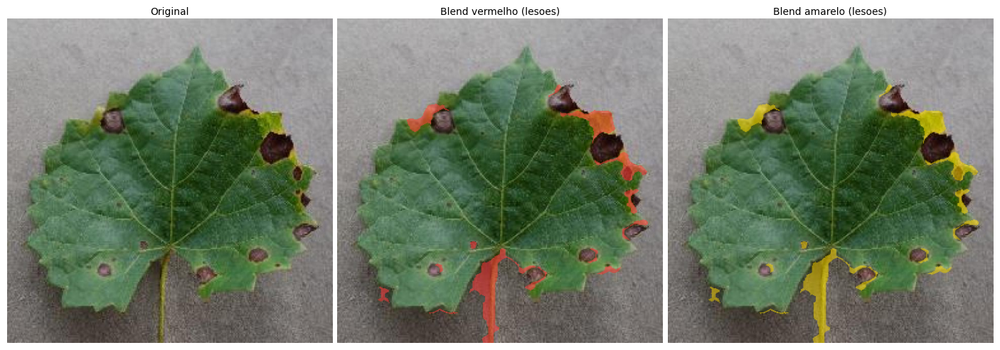


  Analise: Blend/Paste (alpha compositing)
  pixel_final = original * (1 - alpha*mascara) + cor_destaque * (alpha*mascara)
  mascara=0 (fora da lesao): mantem o pixel original
  mascara=1 (dentro): mistura original + cor de destaque


In [23]:
blend_r = destacar_regiao_doenca(IMG_A, mascara_lesao, cor_destaque=(255,  60,  60))
blend_y = destacar_regiao_doenca(IMG_A, mascara_lesao, cor_destaque=(255, 220,   0), alpha=0.5)

grade(
    [IMG_A, blend_r, blend_y],
    ['Original', 'Blend vermelho (lesoes)', 'Blend amarelo (lesoes)'],
    cols=3, figsize=(14, 5),
    nome='10_blend_paste.png', results_dir=RD['detection'],
)

sep('Analise: Blend/Paste (alpha compositing)')
print('  pixel_final = original * (1 - alpha*mascara) + cor_destaque * (alpha*mascara)')
print('  mascara=0 (fora da lesao): mantem o pixel original')
print('  mascara=1 (dentro): mistura original + cor de destaque')


  Salvo -> c:\Users\felip\OneDrive\Documentos\Estudos\PID_Project\results\04_detection_blend\11_diagnostico_roi.png


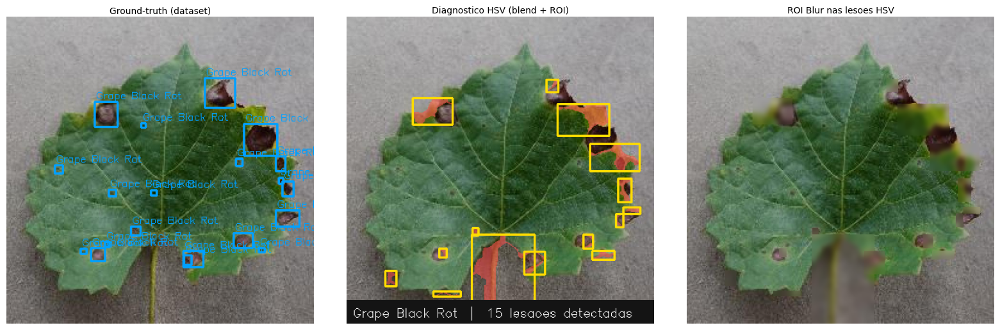


  Analise: ROI (Region of Interest)
ROI = recorte retangular onde aplicamos uma operacao: img[y:y+h, x:x+w].
  15 bounding boxes processadas pelo HSV:
  Lesao 1: x=270 y=85 w=16 h=17  area=272 px
  Lesao 2: x=89 y=110 w=54 h=36  area=1944 px
  Lesao 3: x=285 y=118 w=70 h=43  area=3010 px
  Lesao 4: x=329 y=172 w=67 h=37  area=2479 px
  Lesao 5: x=367 y=219 w=18 h=32  area=576 px
  Lesao 6: x=374 y=258 w=23 h=9  area=207 px
  Lesao 7: x=364 y=267 w=10 h=18  area=180 px
  Lesao 8: x=170 y=286 w=8 h=10  area=80 px
  Lesao 9: x=169 y=295 w=85 h=121  area=10285 px
  Lesao 10: x=320 y=295 w=13 h=19  area=247 px
  Lesao 11: x=125 y=314 w=10 h=12  area=120 px
  Lesao 12: x=332 y=317 w=30 h=12  area=360 px
  Lesao 13: x=240 y=318 w=28 h=31  area=868 px
  Lesao 14: x=52 y=344 w=15 h=21  area=315 px
  Lesao 15: x=117 y=372 w=37 h=7  area=259 px


In [24]:
diagnostico = compor_diagnostico_visual(IMG_A, mascara_lesao, bboxes, NOME_A)

img_roi_blur = IMG_A.copy()
for (x, y, w, h) in bboxes:
    img_roi_blur = aplicar_blur_em_roi(img_roi_blur, x, y, w, h, ksize=(21, 21))

grade(
    [desenhar_boxes(IMG_A, GT_A, CLASSES), diagnostico, img_roi_blur],
    ['Ground-truth (dataset)', 'Diagnostico HSV (blend + ROI)', 'ROI Blur nas lesoes HSV'],
    cols=3, figsize=(16, 5),
    nome='11_diagnostico_roi.png', results_dir=RD['detection'],
)

sep('Analise: ROI (Region of Interest)')
print('ROI = recorte retangular onde aplicamos uma operacao: img[y:y+h, x:x+w].')
print(f'  {len(bboxes)} bounding boxes processadas pelo HSV:')
for i, (x, y, w, h) in enumerate(bboxes):
    print(f'  Lesao {i+1}: x={x} y={y} w={w} h={h}  area={w*h} px')


---
## 5 · Bloco 4 — YOLOv8 (Detecção) treinado no dataset

Treinamos o **YOLOv8n** para **localizar e classificar** as lesões (bounding boxes),
usando as anotações reais do dataset. Depois comparamos com o método clássico HSV
e medimos a qualidade contra o *ground-truth* (recall / precisão / IoU).

> Pipeline: preparar `data.yaml` → treinar → inferir → comparar HSV × YOLO × GT.

In [25]:
sep('Treinamento YOLOv8n (deteccao)')

import shutil

DATA_YAML   = preparar_yaml_treino(DATA_DIR)
MODELOS_DIR = os.path.join(str(ROOT), 'models')
os.makedirs(MODELOS_DIR, exist_ok=True)

MODELO_BASE     = os.path.join(MODELOS_DIR, 'yolov8n.pt')
MODELO_TREINADO = os.path.join(MODELOS_DIR, 'plant_disease_best.pt')
EPOCAS          = 30

print('data.yaml de treino:', DATA_YAML)
print('Modelos salvos em  :', MODELOS_DIR)

if os.path.exists(MODELO_TREINADO):
    print('Modelo ja treinado encontrado:', MODELO_TREINADO)
    modelo = carregar_modelo_custom(MODELO_TREINADO)
else:
    import torch as _torch
    _device = 0 if _torch.cuda.is_available() else 'cpu'
    print(f'Iniciando treinamento ({EPOCAS} epocas) — device: {_device}')
    _cwd = os.getcwd()
    os.chdir(str(ROOT))
    try:
        modelo, _ = treinar_detector(
            DATA_YAML, epocas=EPOCAS, imgsz=640, batch=16,
            modelo_base=MODELO_BASE,
            nome_experimento='plant_disease',
            project=os.path.join(MODELOS_DIR, 'runs'),
            device=_device,
        )
        _run_dir = str(modelo.trainer.save_dir)
    except AttributeError:
        import glob as _g
        _candidatos = sorted(_g.glob(
            os.path.join(MODELOS_DIR, 'runs', 'plant_disease*', 'weights', 'best.pt')))
        if not _candidatos:
            raise FileNotFoundError('best.pt nao encontrado apos treinamento.')
        _run_dir = os.path.dirname(os.path.dirname(_candidatos[-1]))
    finally:
        os.chdir(_cwd)
    best = os.path.join(_run_dir, 'weights', 'best.pt')
    shutil.copy(best, MODELO_TREINADO)
    print('Treinamento concluido. Pesos salvos em:', MODELO_TREINADO)
    modelo = carregar_modelo_custom(MODELO_TREINADO)

print('Modelo pronto para inferencia.')



  Treinamento YOLOv8n (deteccao)
data.yaml de treino: c:\Users\felip\OneDrive\Documentos\Estudos\PID_Project\data\data_treino.yaml
Modelos salvos em  : c:\Users\felip\OneDrive\Documentos\Estudos\PID_Project\models
Modelo ja treinado encontrado: c:\Users\felip\OneDrive\Documentos\Estudos\PID_Project\models\plant_disease_best.pt
Modelo pronto para inferencia.



Gerando gráficos em: c:\Users\felip\OneDrive\Documentos\Estudos\PID_Project\results\treinamento


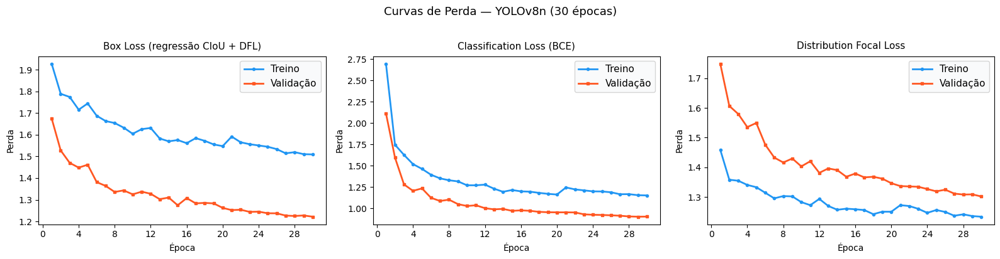

  Salvo -> c:\Users\felip\OneDrive\Documentos\Estudos\PID_Project\results\treinamento\01_curvas_perda.png


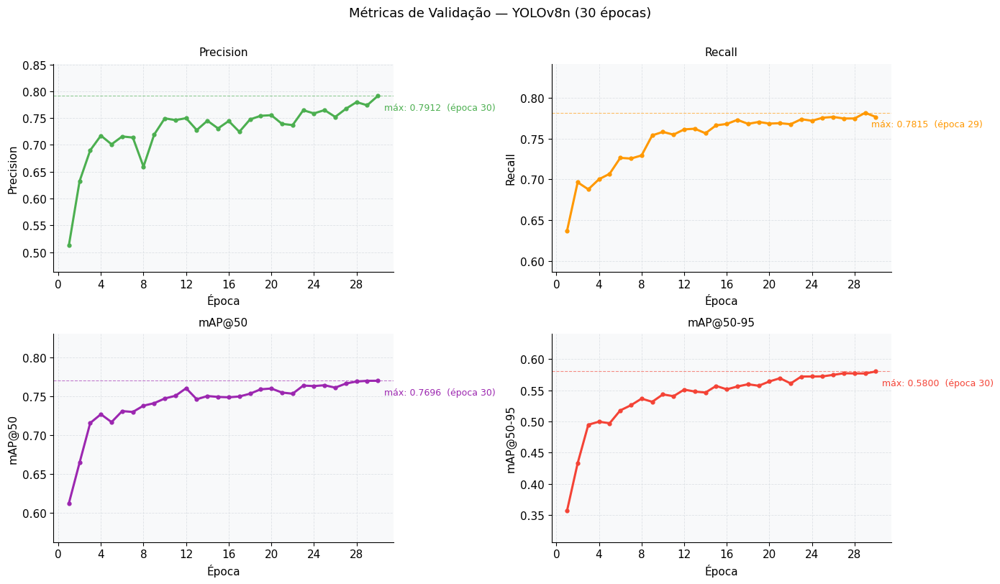

  Salvo -> c:\Users\felip\OneDrive\Documentos\Estudos\PID_Project\results\treinamento\02_metricas_validacao.png


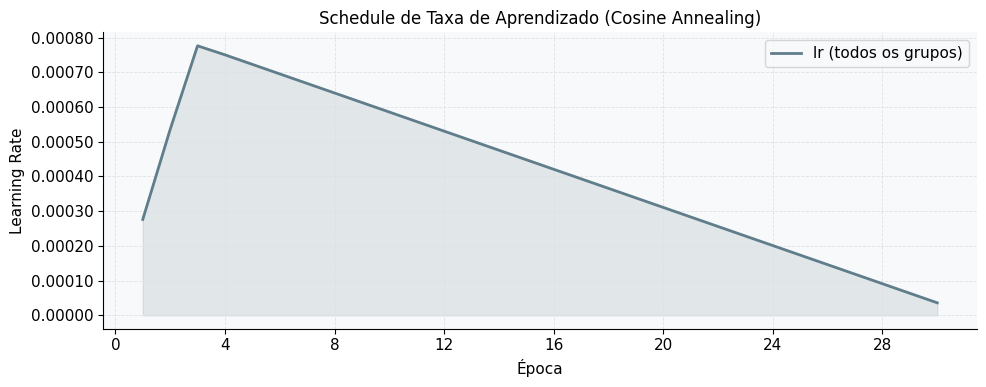

  Salvo -> c:\Users\felip\OneDrive\Documentos\Estudos\PID_Project\results\treinamento\03_learning_rate.png


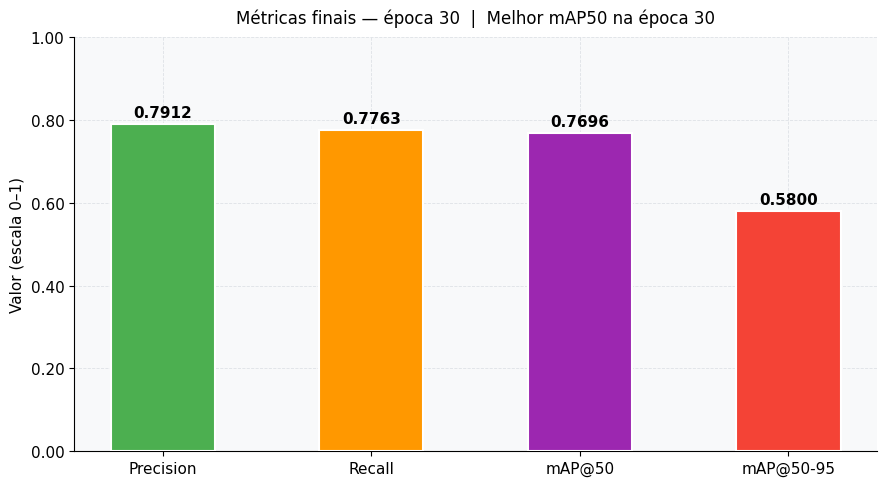

  Salvo -> c:\Users\felip\OneDrive\Documentos\Estudos\PID_Project\results\treinamento\04_resumo_final.png
  Copiado -> c:\Users\felip\OneDrive\Documentos\Estudos\PID_Project\results\treinamento\05_confusion_matrix_norm.png


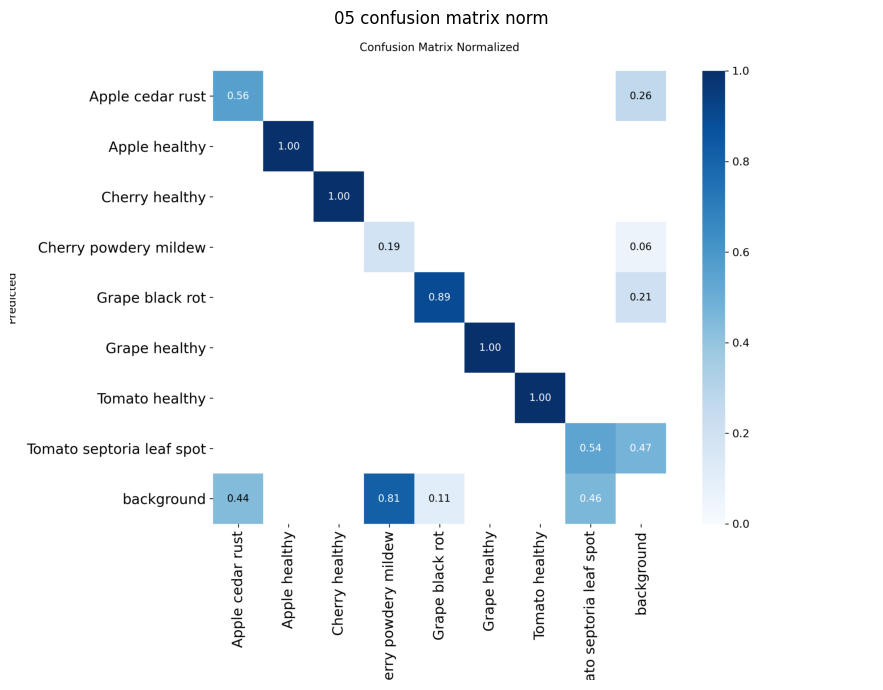

  Copiado -> c:\Users\felip\OneDrive\Documentos\Estudos\PID_Project\results\treinamento\06_confusion_matrix.png


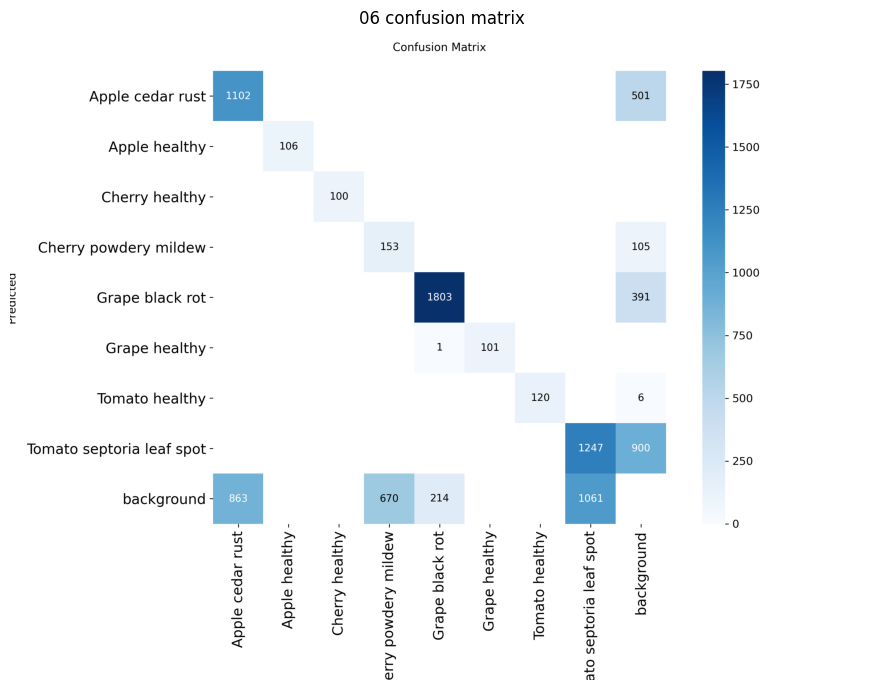

  Copiado -> c:\Users\felip\OneDrive\Documentos\Estudos\PID_Project\results\treinamento\07_pr_curve.png


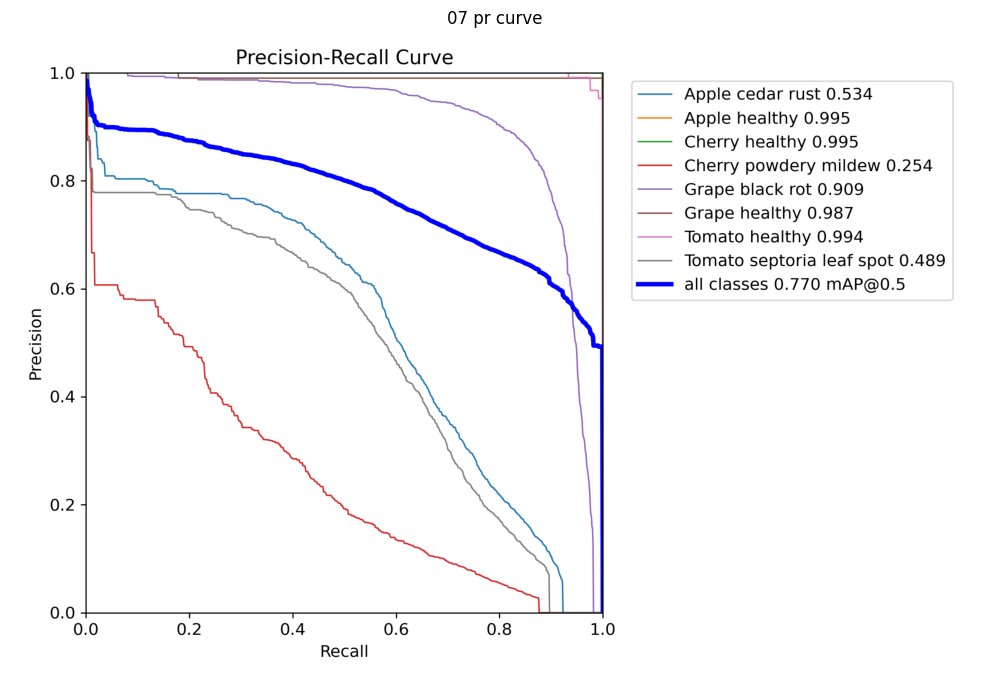

  Copiado -> c:\Users\felip\OneDrive\Documentos\Estudos\PID_Project\results\treinamento\08_f1_curve.png


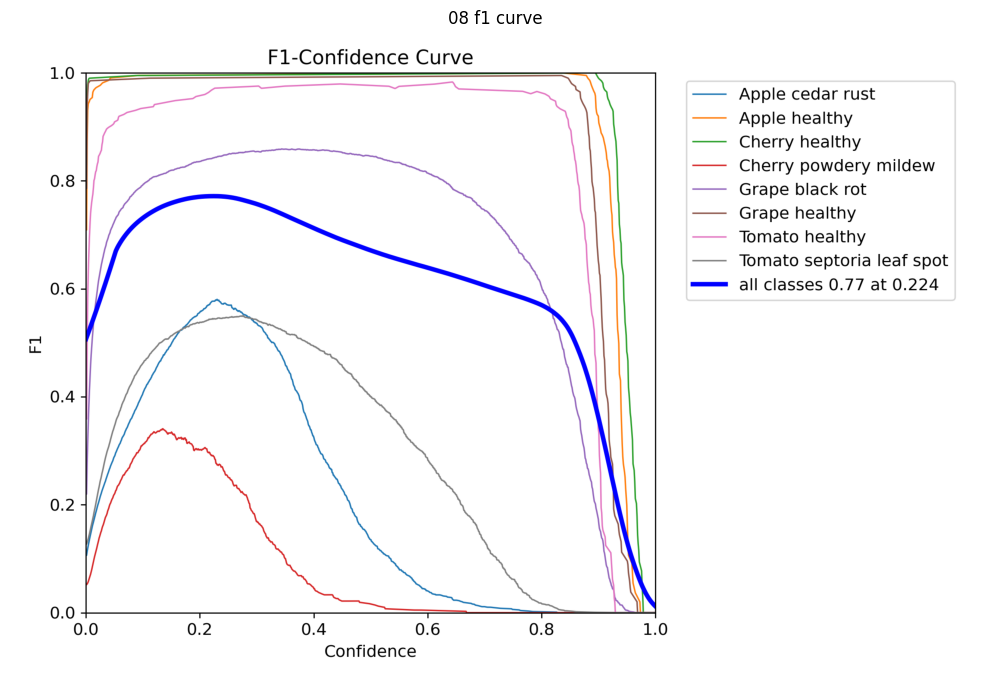

  Copiado -> c:\Users\felip\OneDrive\Documentos\Estudos\PID_Project\results\treinamento\09_precision_curve.png


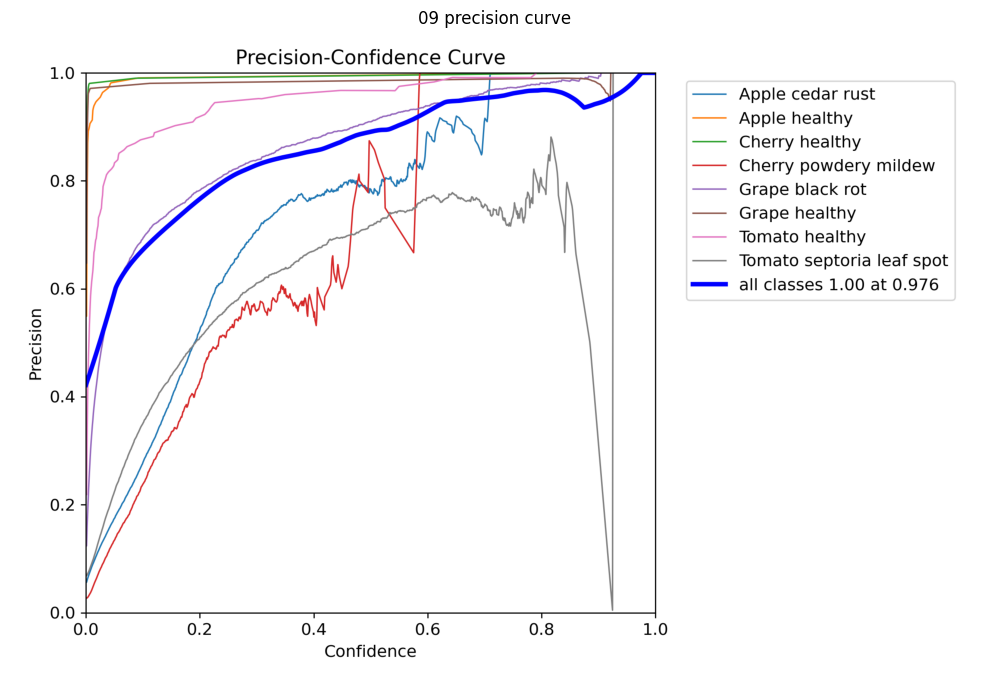

  Copiado -> c:\Users\felip\OneDrive\Documentos\Estudos\PID_Project\results\treinamento\10_recall_curve.png


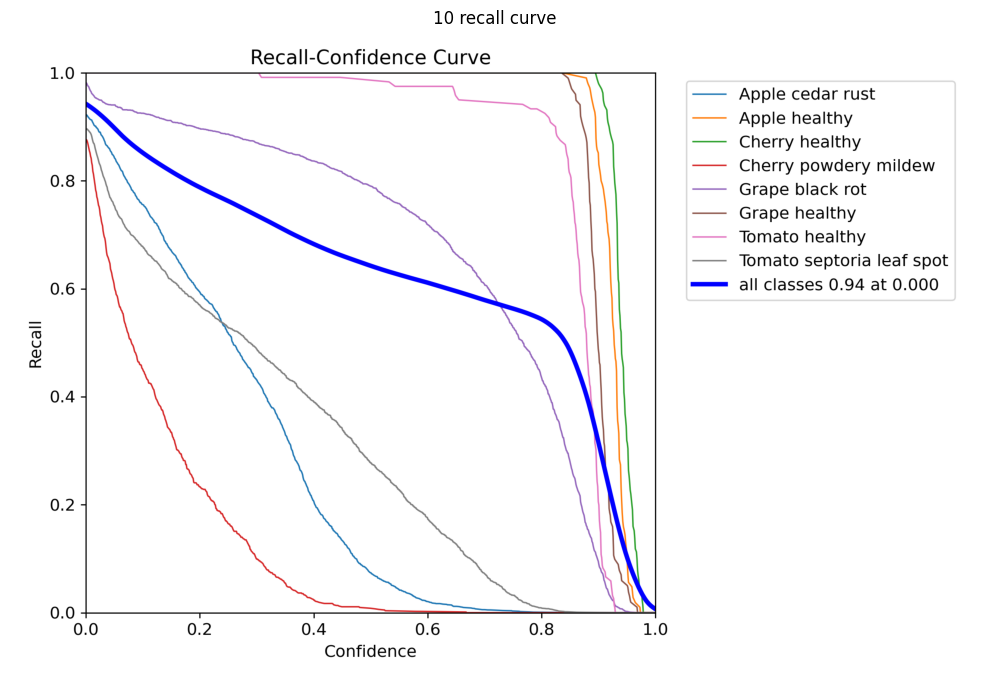

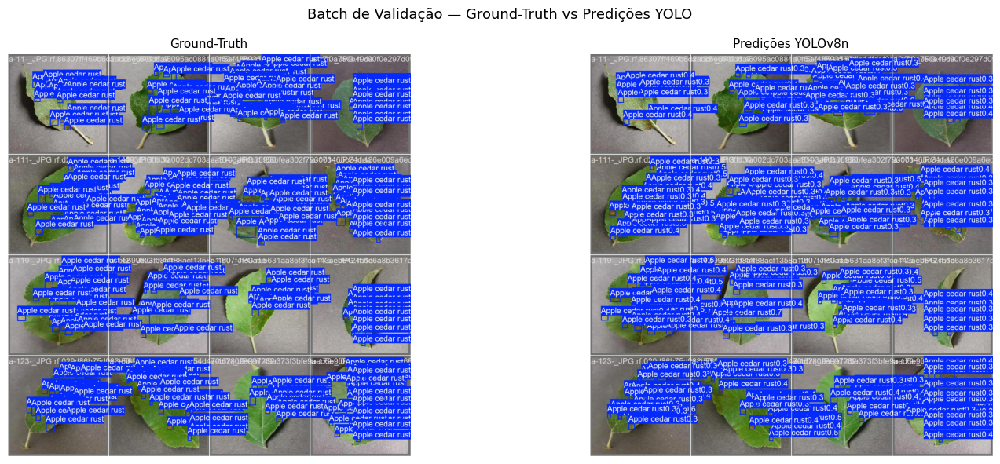

  Salvo -> c:\Users\felip\OneDrive\Documentos\Estudos\PID_Project\results\treinamento\11_val_batch_comparacao.png

11 arquivo(s) em c:\Users\felip\OneDrive\Documentos\Estudos\PID_Project\results\treinamento:
  01_curvas_perda.png                              86.1 KB
  02_metricas_validacao.png                       135.1 KB
  03_learning_rate.png                             59.4 KB
  04_resumo_final.png                              33.6 KB
  05_confusion_matrix_norm.png                    237.5 KB
  06_confusion_matrix.png                         241.3 KB
  07_pr_curve.png                                 231.6 KB
  08_f1_curve.png                                 289.5 KB
  09_precision_curve.png                          263.4 KB
  10_recall_curve.png                             280.2 KB
  11_val_batch_comparacao.png                    1392.2 KB


In [26]:
from training_plots import gerar_graficos

RESULTS_CSV = os.path.join(str(ROOT), 'models', 'runs', 'plant_disease', 'results.csv')
RUN_DIR     = os.path.join(str(ROOT), 'models', 'runs', 'plant_disease')
TREINAMENTO = os.path.join(str(ROOT), 'results', 'treinamento')

gerar_graficos(RESULTS_CSV, RUN_DIR, TREINAMENTO, dpi=120, mostrar=True)

  Salvo -> c:\Users\felip\OneDrive\Documentos\Estudos\PID_Project\results\05_yolo\13_yolo_deteccao.png


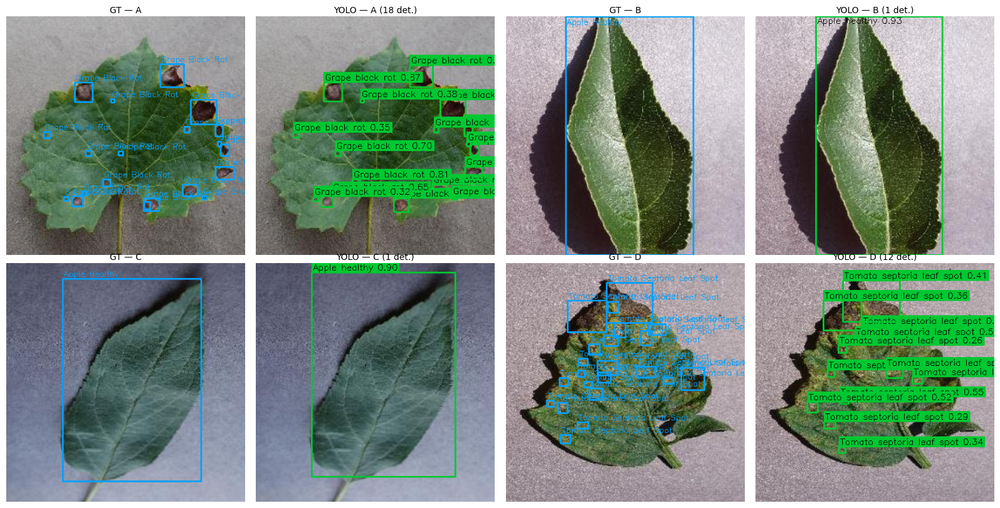

Deteccoes YOLO — Amostra A (18):
  Grape black rot              conf=0.92  area=546 px
  Grape black rot              conf=0.92  area=1848 px
  Grape black rot              conf=0.91  area=660 px
  Grape black rot              conf=0.90  area=380 px
  Grape black rot              conf=0.87  area=1056 px
  Grape black rot              conf=0.85  area=280 px
  Grape black rot              conf=0.85  area=624 px
  Grape black rot              conf=0.81  area=169 px
  Grape black rot              conf=0.79  area=1520 px
  Grape black rot              conf=0.74  area=285 px
  Grape black rot              conf=0.70  area=81 px
  Grape black rot              conf=0.65  area=48 px
  Grape black rot              conf=0.65  area=54 px
  Grape black rot              conf=0.40  area=56 px
  Grape black rot              conf=0.38  area=36 px
  Grape black rot              conf=0.35  area=90 px
  Grape black rot              conf=0.32  area=64 px
  Grape black rot              conf=0.25  area=72 px


In [27]:
# Inferencia em A, B, C e D
img_det_a, dets_a = detectar_objetos(IMG_A, modelo, confianca=0.25)
img_det_b, dets_b = detectar_objetos(IMG_B, modelo, confianca=0.25)
img_det_c, dets_c = detectar_objetos(IMG_C, modelo, confianca=0.25)
img_det_d, dets_d = detectar_objetos(IMG_D, modelo, confianca=0.25)

grade(
    [desenhar_boxes(IMG_A, GT_A, CLASSES), img_det_a,
     desenhar_boxes(IMG_B, GT_B, CLASSES), img_det_b,
     desenhar_boxes(IMG_C, GT_C, CLASSES), img_det_c,
     desenhar_boxes(IMG_D, GT_D, CLASSES), img_det_d],
    ['GT — A', f'YOLO — A ({len(dets_a)} det.)',
     'GT — B', f'YOLO — B ({len(dets_b)} det.)',
     'GT — C', f'YOLO — C ({len(dets_c)} det.)',
     'GT — D', f'YOLO — D ({len(dets_d)} det.)'],
    cols=4, figsize=(16, 8),
    nome='13_yolo_deteccao.png', results_dir=RD['yolo'],
)

print(f'Deteccoes YOLO — Amostra A ({len(dets_a)}):')
for d in dets_a:
    x1, y1, x2, y2 = d['bbox']
    print(f"  {d['classe']:<28} conf={d['confianca']:.2f}  area={(x2-x1)*(y2-y1)} px")


In [28]:
sep('Analise: YOLO vs HSV vs Ground-Truth (Amostra A)')

yolo_xyxy = [d['bbox'] for d in dets_a]
m_yolo = casar_caixas(gt_xyxy, yolo_xyxy, iou_min=0.2)   # gt_xyxy/hsv vem do Bloco 3

print(f'Ground-truth: {m_hsv["n_gt"]} caixas reais.  Metrica de matching: IoU >= 0.2')
print()
print(f'  {"Metodo":<22}  {"Caixas":>6}  {"TP":>4}  {"Recall":>8}  {"Precision":>10}  {"IoU med":>8}')
print(f'  {"-"*68}')
print(f'  {"Classico HSV":<22}  {m_hsv["n_pred"]:>6}  {m_hsv["tp"]:>4}  '
      f'{m_hsv["recall"]*100:>7.1f}%  {m_hsv["precision"]*100:>9.1f}%  {m_hsv["iou_medio"]:>8.2f}')
print(f'  {"YOLOv8 (treinado)":<22}  {m_yolo["n_pred"]:>6}  {m_yolo["tp"]:>4}  '
      f'{m_yolo["recall"]*100:>7.1f}%  {m_yolo["precision"]*100:>9.1f}%  {m_yolo["iou_medio"]:>8.2f}')
print()
print('Leitura:')
print('  Recall    = quantas lesoes reais o metodo conseguiu cobrir.')
print('  Precision = quantas das caixas previstas eram realmente lesao.')
print('  IoU medio = o quao bem as caixas previstas se sobrepoem as reais.')
print()
if dets_a:
    classes_det = sorted({d["classe"] for d in dets_a})
    print('Vantagem do YOLO: identifica a CLASSE da doenca e detecta lesoes de')
    print('qualquer cor. Classes previstas nesta imagem:', classes_det)
else:
    print('YOLO nao detectou lesoes (conf<0.25). Treine mais epocas ou reduza a confianca.')
print('Vantagem do HSV: nao precisa de treino e da mascara pixel-a-pixel.')


  Analise: YOLO vs HSV vs Ground-Truth (Amostra A)
Ground-truth: 20 caixas reais.  Metrica de matching: IoU >= 0.2

  Metodo                  Caixas    TP    Recall   Precision   IoU med
  --------------------------------------------------------------------
  Classico HSV                15     7     35.0%       46.7%      0.39
  YOLOv8 (treinado)           18    18     90.0%      100.0%      0.88

Leitura:
  Recall    = quantas lesoes reais o metodo conseguiu cobrir.
  Precision = quantas das caixas previstas eram realmente lesao.
  IoU medio = o quao bem as caixas previstas se sobrepoem as reais.

Vantagem do YOLO: identifica a CLASSE da doenca e detecta lesoes de
qualquer cor. Classes previstas nesta imagem: ['Grape black rot']
Vantagem do HSV: nao precisa de treino e da mascara pixel-a-pixel.


  Salvo -> c:\Users\felip\OneDrive\Documentos\Estudos\PID_Project\results\05_yolo\14_yolo_vs_classico.png


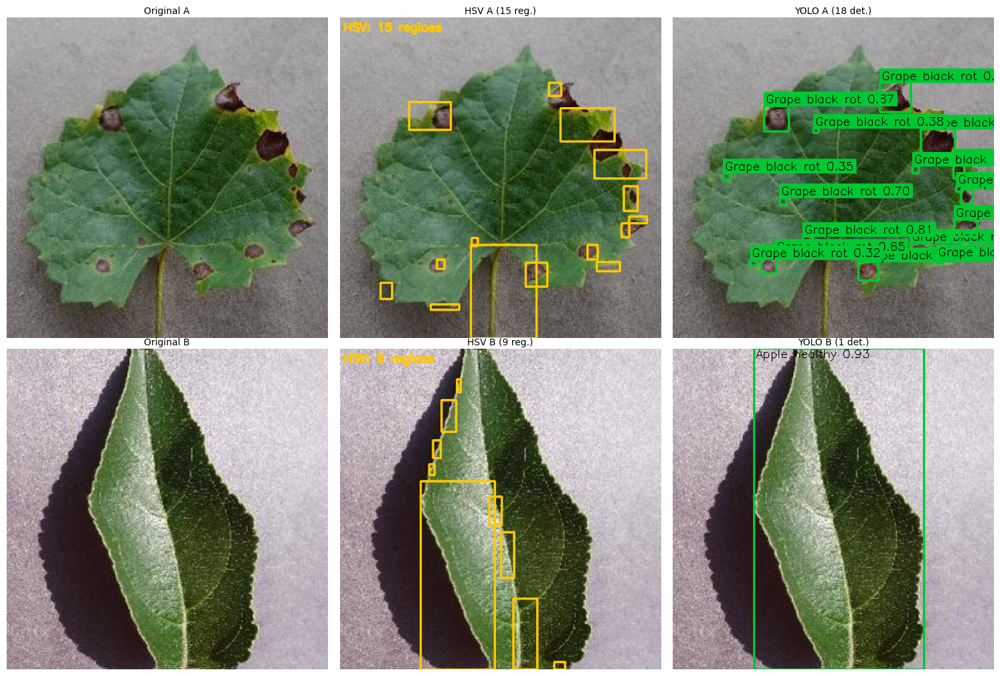

In [29]:
# Comparacao visual: Original | HSV | YOLO para amostras A e B
img_hsv_bbox = IMG_A.copy()
for (x, y, w, h) in bboxes:
    cv2.rectangle(img_hsv_bbox, (x, y), (x + w, y + h), (255, 200, 0), 2)
cv2.putText(img_hsv_bbox, f'HSV: {len(bboxes)} regioes', (4, 18),
            cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 200, 0), 2)

_, mascara_folha_b = segmentar_folha_verde(IMG_B)
mascara_lesao_b, _, n_lesoes_b, bboxes_b = detectar_lesoes_hsv(
    IMG_B, sensibilidade='media', mascara_folha=mascara_folha_b)
img_hsv_bbox_b = IMG_B.copy()
for (x, y, w, h) in bboxes_b:
    cv2.rectangle(img_hsv_bbox_b, (x, y), (x + w, y + h), (255, 200, 0), 2)
cv2.putText(img_hsv_bbox_b, f'HSV: {len(bboxes_b)} regioes', (4, 18),
            cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 200, 0), 2)

grade(
    [IMG_A, img_hsv_bbox, img_det_a,
     IMG_B, img_hsv_bbox_b, img_det_b],
    ['Original A', f'HSV A ({len(bboxes)} reg.)',  f'YOLO A ({len(dets_a)} det.)',
     'Original B', f'HSV B ({len(bboxes_b)} reg.)', f'YOLO B ({len(dets_b)} det.)'],
    cols=3, figsize=(15, 10),
    nome='14_yolo_vs_classico.png', results_dir=RD['yolo'],
)

  Salvo -> c:\Users\felip\OneDrive\Documentos\Estudos\PID_Project\results\05_yolo\15_yolo_teste_lote.png


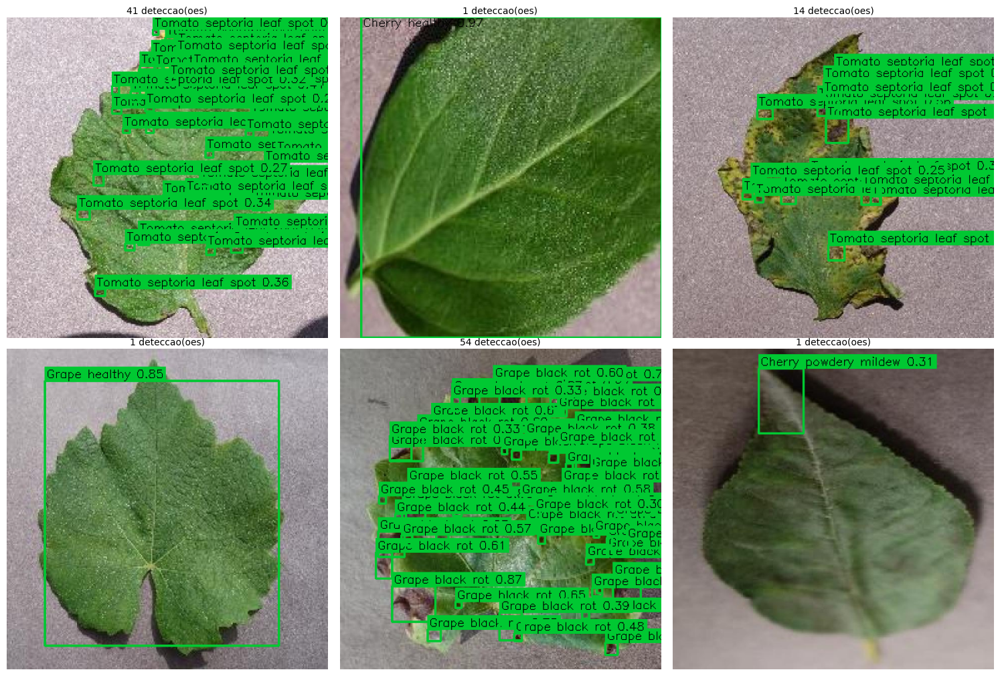

In [30]:
# Inferencia em lote: 6 imagens do conjunto de teste
teste = amostrar_imagens(DATA_DIR, n=6, split='test', com_label=False, semente=3)
if not teste:
    teste = amostrar_imagens(DATA_DIR, n=6, split='valid', com_label=False, semente=3)

imgs_t, tits_t = [], []
for p in teste:
    im = cv2.resize(carregar_imagem_rgb(p), TAMANHO)
    det_im, dets = detectar_objetos(im, modelo, confianca=0.25)
    imgs_t.append(det_im)
    tits_t.append(f"{len(dets)} deteccao(oes)")

if imgs_t:
    grade(imgs_t, tits_t, cols=3, figsize=(15, 10),
          nome='15_yolo_teste_lote.png', results_dir=RD['yolo'])


---
## 6 · Comparação: Método Clássico (HSV) vs YOLO

  Salvo -> c:\Users\felip\OneDrive\Documentos\Estudos\PID_Project\results\06_comparacao\16_comparacao_final.png


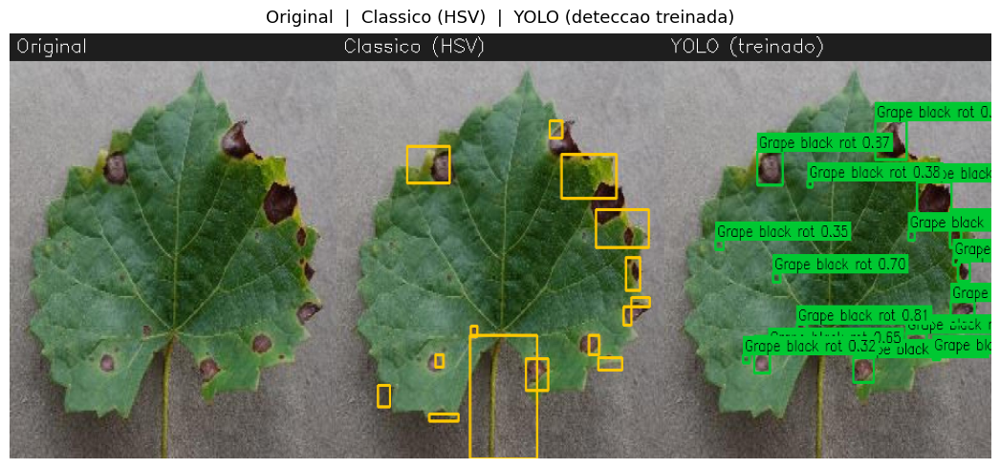

In [31]:
comparacao = comparar_metodos(
    IMG_A, img_hsv_bbox, img_det_a,
    label_classico='Classico (HSV)', label_yolo='YOLO (treinado)',
)

fig, ax = plt.subplots(figsize=(16, 5), dpi=100)
ax.imshow(comparacao); ax.axis('off')
ax.set_title('Original  |  Classico (HSV)  |  YOLO (deteccao treinada)', fontsize=13, pad=8)
plt.tight_layout()
os.makedirs(RD['comp'], exist_ok=True)
fig.savefig(os.path.join(RD['comp'], '16_comparacao_final.png'), bbox_inches='tight', dpi=100)
print(f"  Salvo -> {os.path.join(RD['comp'], '16_comparacao_final.png')}")
plt.show(); plt.close(fig)


In [32]:
sep('Tabela Comparativa Final')

print(f'  {"Criterio":<30}  {"Classico (HSV)":<26}  {"YOLO (deteccao)"}')
print(f'  {"-"*82}')
linhas = [
    ('Objetivo',                 'Localizar lesoes',           'Localizar + classificar lesoes'),
    ('Saida',                    'Mascara px + bboxes',        'Bbox + classe + confianca'),
    ('Precisa de treinamento?',  'Nao',                        'Sim (dataset YOLO + GPU ideal)'),
    ('Identifica a doenca?',     'Nao',                        'Sim (classe por caixa)'),
    ('Detecta qualquer cor?',    'Nao (faixa HSV fixa)',       'Sim (aprende dos exemplos)'),
    ('Sensivel a iluminacao',    'Sim (HSV calibrado)',        'Menos (aprende invariancias)'),
    ('Velocidade',               'Muito rapida',               'Rapida (~ms/imagem)'),
    ('Interpretabilidade',       'Alta (mascara visual)',      'Media (bbox + conf)'),
    ('Funciona sem GPU',         'Sim',                        'Inferencia sim; treino lento'),
]
for crit, clas, yolo in linhas:
    print(f'  {crit:<30}  {clas:<26}  {yolo}')
print()
print('Analise especifica para o Plant Disease Detection (8 classes, 4000 imagens):')
print()
print('  HSV detecta bem   : Apple cedar rust, Grape black rot, borda Tomato septoria')
print('  HSV falha          : Cherry powdery mildew (branco), centro Tomato septoria')
print('  YOLO detecta todas : aprende cada classe independentemente pelo ground-truth')
print()
print(f'  YOLO — Caixas: {m_yolo["n_pred"]}  TP: {m_yolo["tp"]}  Recall: {m_yolo["recall"]*100:.1f}%  Precision: {m_yolo["precision"]*100:.1f}%  IoU: {m_yolo["iou_medio"]:.2f}')
print(f'  HSV  — Caixas: {m_hsv["n_pred"]}  TP: {m_hsv["tp"]}  Recall: {m_hsv["recall"]*100:.1f}%  Precision: {m_hsv["precision"]*100:.1f}%  IoU: {m_hsv["iou_medio"]:.2f}')
print()
print('Conclusao: o HSV funciona para doencas de cor previsivel (laranja/marrom),')
print('mas nao nomeia a doenca nem detecta Cherry powdery mildew (branco/cinza).')
print('O YOLO (YOLOv8n, 30 epocas, dataset Roboflow) localiza E classifica as 4')
print('doencas (cedar rust, powdery mildew, black rot, septoria leaf spot) com')
print('precisao mensuravel por IoU/recall, a custo de treinamento supervisionado.')


  Tabela Comparativa Final
  Criterio                        Classico (HSV)              YOLO (deteccao)
  ----------------------------------------------------------------------------------
  Objetivo                        Localizar lesoes            Localizar + classificar lesoes
  Saida                           Mascara px + bboxes         Bbox + classe + confianca
  Precisa de treinamento?         Nao                         Sim (dataset YOLO + GPU ideal)
  Identifica a doenca?            Nao                         Sim (classe por caixa)
  Detecta qualquer cor?           Nao (faixa HSV fixa)        Sim (aprende dos exemplos)
  Sensivel a iluminacao           Sim (HSV calibrado)         Menos (aprende invariancias)
  Velocidade                      Muito rapida                Rapida (~ms/imagem)
  Interpretabilidade              Alta (mascara visual)       Media (bbox + conf)
  Funciona sem GPU                Sim                         Inferencia sim; treino lento

Analise especi

---
## 7 · Arquivos Gerados em `results/`

In [33]:
print(f'  {"Secao":<20} {"Arquivo":<46} {"Tamanho":>10}')
print('-' * 78)
total_arqs = 0
for secao, pasta in RD.items():
    if not os.path.isdir(pasta):
        continue
    for f in sorted(f for f in os.listdir(pasta) if f.endswith(('.png', '.jpg'))):
        tam = os.path.getsize(os.path.join(pasta, f)) / 1024
        print(f'  {secao:<20} {f:<46} {tam:>6.1f} KB')
        total_arqs += 1
print()
print(f'Total: {total_arqs} arquivo(s) em results/')


  Secao                Arquivo                                           Tamanho
------------------------------------------------------------------------------
  dataset              00_amostras_dataset.png                        2578.2 KB
  dataset              00b_amostras_principais.png                     951.9 KB
  blur                 01_blur_comparacao.png                         1861.2 KB
  blur                 02_threshold_comparacao.png                    1067.7 KB
  blur                 03_threshold_amostras.png                      1049.1 KB
  edges                04_canny.png                                   1059.5 KB
  edges                05_sobel.png                                   2318.3 KB
  edges                06_cantos.png                                  1114.9 KB
  edges                07_contornos.png                                971.4 KB
  detection            08_segmentacao_folha.png                        354.1 KB
  detection            09_lesoes_hsv.png